# 🧠 Graph Neural Networks (GNNs) in Football

## 🎯 Objective
This notebook demonstrates how to use **Graph Neural Networks (GNNs)** to model complex player interactions from football **tracking and event data**, and to predict **xPass** — the *expected probability that a pass will be completed successfully*.

By the end of this notebook, you will learn how to:
- Transform raw tracking data into graph structures.
- Train a GNN to predict the likelihood of each player to be the receiver of the pass (xReceiver).
- Train a GNN to predict the likelihood of a successful pass (xPass).
- Evaluate players and teams based on their passing decision quality and execution.
- Visualize xPass predictions and compare them to real outcomes.

Based on research paper by Power et al. : Making	Offensive Play Predictable - Using a Graph Convolutional Network to Understand	Defensive Performance in Soccer.
---

## ⚽ What is xPass?

`xPass` (Expected Pass Success) estimates the **probability that a given pass attempt will be successful**, considering:
- Player and ball positions.
- Velocity, spacing, and relative geometry of teammates and opponents.
- Dynamic context of the game (e.g., under pressure, verticality, pass length).

Unlike simple pass completion stats, **xPass captures decision difficulty** —  
a player completing passes with lower xPass values is performing *above expectation*.

---

## 🧩 Notebook Structure

### 1. **Introduction to Graph Representation**
We discuss why tracking data is *unstructured* and how representing players and the ball as nodes in a graph solves the player-ordering problem.

### 2. **Data Preparation**
We extract *decision frames* (snapshots just before a pass) from tracking data, compute player velocities, and align them with corresponding event data.

### 3. **Graph Construction**
Each frame is converted into a graph:
- Nodes: players + ball (with spatial and contextual features)
- Edges: pairwise relations (distance, angle, team relation, etc.)
- Labels: pass success, target, and context

### 4. **PyTorch Geometric Dataset**
We convert all graph dictionaries into `torch_geometric.data.Data` objects to efficiently batch and train them with PyTorch Geometric.

### 5. **Modeling xPass with Graph Neural Networks**
We implement a **GraphSAGE** model that learns to predict pass success probability directly from graph structure, without manual feature engineering.

### 6. **Training and Evaluation**
- Train the GNN to predict `xPass` values.
- Evaluate performance on validation data (loss curves, calibration, accuracy).
- Interpret what the model learns about spatial passing dynamics.

### 7. **Visualizations**
We visualize:
- Player-ball interactions for specific passes.
- The model’s predicted xPass vs. actual pass outcome.
- Team and player-level xPass distributions.

### 8. **Player-Level Analysis**
Compute each player’s:
- Average predicted xPass (expected difficulty)
- Actual pass success rate  
and analyze **overperformance** (actual – expected), identifying elite passers and risk-takers.

### 9. **Team-Level Insights (Optional)**
Aggregate xPass metrics by team to uncover playing styles:
- Safe possession teams vs. direct attacking teams.
- Clubs exceeding their expected pass completion.

---

## 🧭 Learning Goals

By following this notebook, you will:
1. Understand how **GNNs model relational data** in football analytics.
2. Learn to **construct graph datasets** from tracking and event data.
3. Implement and train a **GraphSAGE** model for a practical football prediction task.
4. Extract actionable football insights from model predictions.

---

## 🛠️ Requirements
This notebook assumes you have:
- All processed decision-frame data under `PremierLeague_data/2024/graph_inputs_decisions`
- Event data under `PremierLeague_data/2024/dynamic`
- Environment `graphnets_env` installed with:
  ```bash
  pip install -r requirements.txt


In [28]:

import os, json
from pathlib import Path
import pandas as pd
import numpy as np

# --- Paths (yours) ---
ROOT = Path.cwd().parents[0]
DYNAMIC_DIR = ROOT / "PremierLeague_data/2024/dynamic"
META_DIR = ROOT / "PremierLeague_data/2024/meta"
TRACKING_DIR = ROOT / "PremierLeague_data/2024/tracking"
PROCESSED_DIR = ROOT / "PremierLeague_data/2024/processed"
PROCESSED_DIR.mkdir(exist_ok=True)
ROLE_AVG_DIR = ROOT / "PremierLeague_data/2024/role_avg"
ROLE_AVG_DIR.mkdir(exist_ok=True)

# Pitch constants (SkillCorner → 105x68, origin at left-bottom after rescale)
X_MIN, X_MAX = -52, 52
Y_MIN, Y_MAX = -34, 34
PITCH_LENGTH, PITCH_WIDTH = 105.0, 68.0

In [53]:
match_id= 1650385
fpath = PROCESSED_DIR / f"{match_id}.parquet"

tr = pd.read_parquet(fpath)
tr.columns

Index(['match_id', 'time', 'frame', 'period', 'player_id', 'is_detected',
       'is_ball', 'x', 'y', 'x_rescaled', 'y_rescaled', 'team_id', 'team_name',
       'team_short', 'player_short_name', 'player_role', 'position_group',
       'home_team_id', 'away_team_id', 'attacking_side', 'x_norm', 'y_norm',
       'ball_in_play', 'in_possession_team'],
      dtype='object')

In [47]:
tr[tr['frame']== 20][['team_id', 'team_name',
       'team_short', 'player_short_name', 'player_role', 'position_group',
       'home_team_id', 'away_team_id',]]

,team_id,team_name,team_short,player_short_name,player_role,position_group,home_team_id,away_team_id
0,48.0,Fulham,Fulham,A. Iwobi,Left Winger,Wide Attacker,31.0,48.0
1,48.0,Fulham,Fulham,B. Leno,Goalkeeper,Other,31.0,48.0
2,31.0,Manchester United,Manchester U,Bruno Fernandes,Center Forward,Center Forward,31.0,48.0
3,31.0,Manchester United,Manchester U,Casemiro,Right Defensive Midfield,Midfield,31.0,48.0
4,48.0,Fulham,Fulham,I. Diop,Right Center Back,Central Defender,31.0,48.0
5,48.0,Fulham,Fulham,K. Tete,Right Back,Full Back,31.0,48.0
6,31.0,Manchester United,Manchester U,M. Rashford,Left Winger,Wide Attacker,31.0,48.0
7,31.0,Manchester United,Manchester U,H. Maguire,Right Center Back,Central Defender,31.0,48.0
8,48.0,Fulham,Fulham,Andreas Pereira,Right Midfield,Midfield,31.0,48.0
9,31.0,Manchester United,Manchester U,A. Onana,Goalkeeper,Other,31.0,48.0


In [6]:
fpath = DYNAMIC_DIR / f"{match_id}.parquet"

ev = pd.read_parquet(fpath)
ev.columns

Index(['event_id', 'index', 'match_id', 'frame_start', 'frame_end',
       'frame_physical_start', 'time_start', 'time_end', 'minute_start',
       'second_start',
       ...
       'xloss_player_possession_end', 'xloss_player_possession_max',
       'xshot_player_possession_start', 'xshot_player_possession_end',
       'xshot_player_possession_max', 'is_player_possession_start_matched',
       'is_player_possession_end_matched', 'is_previous_pass_matched',
       'is_pass_reception_matched', 'fully_extrapolated'],
      dtype='object', length=294)

In [7]:
list(ev.columns)

['event_id',
 'index',
 'match_id',
 'frame_start',
 'frame_end',
 'frame_physical_start',
 'time_start',
 'time_end',
 'minute_start',
 'second_start',
 'duration',
 'period',
 'attacking_side_id',
 'attacking_side',
 'event_type_id',
 'event_type',
 'event_subtype_id',
 'event_subtype',
 'player_id',
 'player_name',
 'player_position_id',
 'player_position',
 'player_in_possession_id',
 'player_in_possession_name',
 'player_in_possession_position_id',
 'player_in_possession_position',
 'team_id',
 'team_shortname',
 'x_start',
 'y_start',
 'channel_id_start',
 'channel_start',
 'third_id_start',
 'third_start',
 'penalty_area_start',
 'x_end',
 'y_end',
 'channel_id_end',
 'channel_end',
 'third_id_end',
 'third_end',
 'penalty_area_end',
 'associated_player_possession_event_id',
 'associated_player_possession_frame_start',
 'associated_player_possession_frame_end',
 'associated_player_possession_end_type_id',
 'associated_player_possession_end_type',
 'associated_off_ball_run_event_

In [8]:
ev.event_type.value_counts()

event_type
passing_option        2508
player_possession      946
on_ball_engagement     885
off_ball_run           525
Name: count, dtype: int64

In [9]:
ev_pos= ev[ev['event_type']== 'player_possession' ]
ev_pos

,event_id,index,match_id,frame_start,frame_end,frame_physical_start,time_start,time_end,minute_start,second_start,...,xloss_player_possession_end,xloss_player_possession_max,xshot_player_possession_start,xshot_player_possession_end,xshot_player_possession_max,is_player_possession_start_matched,is_player_possession_end_matched,is_previous_pass_matched,is_pass_reception_matched,fully_extrapolated
0,8_0,0,1650385,52,52,NaN,00:04.2,00:04.2,0,4,...,NaN,NaN,NaN,NaN,NaN,True,True,None,True,False
2,8_1,2,1650385,62,71,NaN,00:05.2,00:06.1,0,5,...,NaN,NaN,NaN,NaN,NaN,True,True,True,True,False
8,8_2,8,1650385,87,124,NaN,00:07.7,00:11.4,0,7,...,NaN,NaN,NaN,NaN,NaN,True,True,True,True,False
17,8_3,17,1650385,143,152,NaN,00:13.3,00:14.2,0,13,...,NaN,NaN,NaN,NaN,NaN,True,True,True,None,False
22,8_4,22,1650385,160,182,NaN,00:15.0,00:17.2,0,15,...,NaN,NaN,NaN,NaN,NaN,True,True,None,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4838,8_941,4838,1650385,57232,57253,NaN,94:09.2,94:11.3,94,9,...,NaN,NaN,NaN,NaN,NaN,True,True,True,True,False
4844,8_942,4844,1650385,57319,57319,NaN,94:17.9,94:17.9,94,17,...,NaN,NaN,NaN,NaN,NaN,True,True,None,True,False
4848,8_943,4848,1650385,57329,57340,NaN,94:18.9,94:20.0,94,18,...,NaN,NaN,NaN,NaN,NaN,True,True,True,True,False
4854,8_944,4854,1650385,57350,57355,NaN,94:21.0,94:21.5,94,21,...,NaN,NaN,NaN,NaN,NaN,True,True,True,True,False


In [10]:
ev_pos.start_type.value_counts()

start_type
pass_reception            661
recovery                   85
pass_interception          85
keep_possession            26
throw_in_reception         24
free_kick_reception        17
unknown                    15
goal_kick_reception        15
corner_reception            7
free_kick_interception      5
corner_interception         3
throw_in_interception       2
goal_kick_interception      1
Name: count, dtype: int64

In [11]:
ev_pos.end_type.value_counts()

end_type
pass               847
possession_loss     53
shot                24
foul_suffered       12
clearance            8
unknown              2
Name: count, dtype: int64

In [12]:
ev_ex= pd.read_parquet(DYNAMIC_DIR / '1650385.parquet')
ev_ex

,event_id,index,match_id,frame_start,frame_end,frame_physical_start,time_start,time_end,minute_start,second_start,...,xloss_player_possession_end,xloss_player_possession_max,xshot_player_possession_start,xshot_player_possession_end,xshot_player_possession_max,is_player_possession_start_matched,is_player_possession_end_matched,is_previous_pass_matched,is_pass_reception_matched,fully_extrapolated
0,8_0,0,1650385,52,52,NaN,00:04.2,00:04.2,0,4,...,NaN,NaN,NaN,NaN,NaN,True,True,None,True,False
1,1_0,1,1650385,59,72,NaN,00:04.9,00:06.2,0,4,...,NaN,NaN,NaN,NaN,NaN,True,True,None,None,None
2,8_1,2,1650385,62,71,NaN,00:05.2,00:06.1,0,5,...,NaN,NaN,NaN,NaN,NaN,True,True,True,True,False
3,7_0,3,1650385,62,70,NaN,00:05.2,00:06.0,0,5,...,NaN,NaN,NaN,NaN,NaN,True,True,None,None,False
4,9_0,4,1650385,62,71,59.0,00:04.9,00:06.1,0,4,...,0.030,0.092,0.0,0.0,0.0,True,True,True,True,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4859,8_945,4859,1650385,57384,57396,NaN,94:24.4,94:25.6,94,24,...,NaN,NaN,NaN,NaN,NaN,True,True,True,None,False
4860,7_2505,4860,1650385,57384,57396,NaN,94:24.4,94:25.6,94,24,...,NaN,NaN,NaN,NaN,NaN,True,True,None,None,True
4861,7_2506,4861,1650385,57384,57396,NaN,94:24.4,94:25.6,94,24,...,NaN,NaN,NaN,NaN,NaN,True,True,None,None,False
4862,7_2507,4862,1650385,57384,57396,NaN,94:24.4,94:25.6,94,24,...,NaN,NaN,NaN,NaN,NaN,True,True,None,None,True


# Memory-safe per-match extraction (no global concat)

Process one match at a time, write out small “decision-frame” tables you’ll later stream to build graphs:

In [54]:
from pathlib import Path
import pandas as pd
import numpy as np
from scipy.signal import savgol_filter

# ==========================================================
#  Paths and constants
# ==========================================================
PROCESSED_DIR = ROOT / "PremierLeague_data/2024/processed"
DYNAMIC_DIR   = ROOT / "PremierLeague_data/2024/dynamic"
OUT_DIR       = ROOT / "PremierLeague_data/2024/graph_inputs_decisions"
OUT_DIR.mkdir(parents=True, exist_ok=True)

FPS = 10.0        # frames per second
SAFETY_FRAMES = 2 # frames before pass end for decision snapshot


# ==========================================================
#  Velocity computation per player
# ==========================================================
def compute_velocities_per_player(df_player: pd.DataFrame, fps: float = FPS) -> pd.DataFrame:
    """Compute smoothed velocities (vx, vy) per player with interpolation."""
    df_player = df_player.sort_values("frame").copy()

    # Build full frame index for short missing gaps
    full_idx = pd.RangeIndex(df_player["frame"].min(), df_player["frame"].max() + 1)
    df_player = df_player.set_index("frame").reindex(full_idx)

    # Interpolate x,y for up to 3 missing frames (~0.3s)
    df_player[["x_norm", "y_norm"]] = df_player[["x_norm", "y_norm"]].interpolate(limit=3)

    # Compute dx, dy, dt
    df_player["dx"] = df_player["x_norm"].diff()
    df_player["dy"] = df_player["y_norm"].diff()
    df_player["dt"] = df_player.index.to_series().diff() / fps

    # Compute velocities safely
    df_player["vx"] = df_player["dx"] / df_player["dt"].replace(0, np.nan)
    df_player["vy"] = df_player["dy"] / df_player["dt"].replace(0, np.nan)

    # Smooth using Savitzky–Golay if enough frames
    def smooth_sig(x):
        if x.notna().sum() < 5:
            return x
        x_filled = x.interpolate(limit_direction="both")
        return pd.Series(savgol_filter(x_filled, window_length=5, polyorder=2))

    df_player["vx"] = smooth_sig(df_player["vx"])
    df_player["vy"] = smooth_sig(df_player["vy"])

    return df_player.reset_index().rename(columns={"index": "frame"})


# ==========================================================
#  Main per-match extraction
# ==========================================================
def extract_decision_frames_for_match(match_id: int):
    print(f"Processing match {match_id} ...")

    # --- 1. Load ONE match ---
    tr_path = PROCESSED_DIR / f"{match_id}.parquet"
    ev_path = DYNAMIC_DIR   / f"{match_id}.parquet"
    if not tr_path.exists() or not ev_path.exists():
        print(f"⚠️ Missing data for {match_id}")
        return

    tr = pd.read_parquet(tr_path)
    ev = pd.read_parquet(ev_path)

    # --- 2. Filter tracking for valid frames ---
    tr = tr[(tr["ball_in_play"]) & tr[["x_norm", "y_norm"]].notna().all(axis=1)].copy()

    # Normalize datatypes
    tr["match_id"] = tr["match_id"].astype(int)
    ev["match_id"] = ev["match_id"].astype(int)
    if ev["period"].dtype != tr["period"].dtype:
        try:
            ev["period"] = ev["period"].astype(int)
        except Exception:
            ev["period"] = ev["period"].replace({101:1, 102:2}).astype(int)

    # --- 3. Compute per-player velocities ---
    tr = (
        tr.groupby("player_id", group_keys=False)
          .apply(lambda df: compute_velocities_per_player(df, FPS))
    )

    # ✅ Make sure team_id stays numeric and non-null for all players
    tr["team_id"] = tr["team_id"].fillna(-1).astype(int)

    # --- 4. Filter event data for player possessions ---
    pos = ev[ev["event_type"] == "player_possession"].copy()
    if pos.empty:
        print(f"⚠️ No player_possession events for {match_id}")
        return

    keep_ev_cols = [
        "match_id","period","frame_start","frame_end","team_id",
        "player_id","end_type","player_targeted_id","pass_outcome",
        "lead_to_shot","lead_to_goal"
    ]
    pos = pos[[c for c in keep_ev_cols if c in pos.columns]].copy()
    pos = pos.rename(columns={"player_id": "player_in_possession_id"})

    # --- 5. Compute decision frame (a few frames before pass end) ---
    pos["decision_frame"] = (pos["frame_end"] - SAFETY_FRAMES).clip(lower=pos["frame_start"]).astype(int)

    # --- 6. Extract those decision frames from tracking ---
    frames_of_interest = pos[["match_id","period","decision_frame"]].drop_duplicates()
    frames_of_interest = frames_of_interest.rename(columns={"decision_frame":"frame"})
    tr_dec = tr.merge(frames_of_interest, on=["match_id","period","frame"], how="inner")

    # --- 7. Keep only frames with full 22 players + 1 ball ---
    counts = tr_dec.groupby(["match_id","period","frame"]).agg(
        n_players=("player_id","nunique"),
        n_ball=("is_ball","sum")
    ).reset_index()
    valid_frames = counts[(counts["n_players"] >= 22) & (counts["n_ball"] == 1)][["match_id","period","frame"]]
    tr_dec = tr_dec.merge(valid_frames, on=["match_id","period","frame"], how="inner")

    # --- 8. Merge event labels back ---
    dec_labels = pos.rename(columns={"decision_frame":"frame"})
    dec_labels = dec_labels[[
        "match_id","period","frame","team_id","player_in_possession_id",
        "end_type","player_targeted_id","pass_outcome","lead_to_shot","lead_to_goal"
    ]]
    tr_dec = tr_dec.merge(dec_labels, on=["match_id","period","frame"], how="left", suffixes=("", "_event"))

    # 🧩 If tracking's team_id got overwritten by event's team_id (NaNs for opponents), restore it
    tr_dec["team_id"] = tr_dec["team_id"].fillna(tr_dec["team_id_event"])
    tr_dec.drop(columns=[c for c in tr_dec.columns if c.endswith("_event")], inplace=True)

    # --- 9. Infer carrier if missing ---
    def infer_carrier(tr_frame):
        if not tr_frame["is_ball"].any():
            return np.nan
        bx, by = tr_frame.loc[tr_frame["is_ball"], ["x_norm","y_norm"]].iloc[0]
        team_in_pos = tr_frame["in_possession_team"].iloc[0] if "in_possession_team" in tr_frame else np.nan
        team_players = tr_frame[(tr_frame["team_id"] == team_in_pos) & (~tr_frame["is_ball"])]
        if team_players.empty:
            return np.nan
        dists = np.sqrt((team_players["x_norm"] - bx)**2 + (team_players["y_norm"] - by)**2)
        return team_players.loc[dists.idxmin(), "player_id"]

    missing_mask = tr_dec["player_in_possession_id"].isna()
    if missing_mask.any():
        inferred_carriers = (
            tr_dec[missing_mask]
            .groupby(["match_id","period","frame"], group_keys=False)
            .apply(infer_carrier)
            .rename("inferred_carrier")
            .reset_index()
        )
        tr_dec = tr_dec.merge(inferred_carriers, on=["match_id","period","frame"], how="left")
        tr_dec["player_in_possession_id"].fillna(tr_dec["inferred_carrier"], inplace=True)
        tr_dec.drop(columns="inferred_carrier", inplace=True)

    # --- 10. Select only needed columns ---
    keep_tr_cols = [
        "match_id","period","frame","team_id","player_id","is_ball",
        "x_norm","y_norm","vx","vy","in_possession_team"
    ]
    keep_lbl_cols = [
        "player_in_possession_id","end_type","player_targeted_id",
        "pass_outcome","lead_to_shot","lead_to_goal"
    ]
    cols = [c for c in keep_tr_cols + keep_lbl_cols if c in tr_dec.columns]
    tr_dec = tr_dec[cols].copy()

    # --- 11. Save per-match decision snapshot ---
    outpath = OUT_DIR / f"{match_id}_decisions.parquet"
    tr_dec.to_parquet(outpath, index=False)
    print(f"💾 Saved {match_id} → {outpath.name} ✅ team_id preserved")
    return outpath


In [55]:
# Example usage for one match
example_match_id = 1651700

outpath = extract_decision_frames_for_match(example_match_id)

# Load the saved parquet to inspect its structure
df_decisions = pd.read_parquet(outpath)

df_decisions.columns


Processing match 1651700 ...
💾 Saved 1651700 → 1651700_decisions.parquet ✅ team_id preserved


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1418122311.py:85: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda df: compute_velocities_per_player(df, FPS))


Index(['match_id', 'period', 'frame', 'team_id', 'player_id', 'is_ball',
       'x_norm', 'y_norm', 'vx', 'vy', 'in_possession_team',
       'player_in_possession_id', 'end_type', 'player_targeted_id',
       'pass_outcome', 'lead_to_shot', 'lead_to_goal'],
      dtype='object')

In [56]:
df_decisions[df_decisions['frame']== 60490]

,match_id,period,frame,team_id,player_id,is_ball,x_norm,y_norm,vx,vy,in_possession_team,player_in_possession_id,end_type,player_targeted_id,pass_outcome,lead_to_shot,lead_to_goal
864,1651700.0,2.0,60490,-1,-1.0,True,89.169231,23.60,-18.124038,8.388571,37.0,628,pass,16483.0,unsuccessful,False,False
1729,1651700.0,2.0,60490,37,628.0,False,16.224519,45.54,-0.444231,-0.674286,37.0,628,pass,16483.0,unsuccessful,False,False
1839,1651700.0,2.0,60490,37,2311.0,False,48.471635,47.24,NaN,NaN,37.0,628,pass,16483.0,unsuccessful,False,False
2704,1651700.0,2.0,60490,39,3066.0,False,12.327404,32.83,-0.435577,0.660000,37.0,628,pass,16483.0,unsuccessful,False,False
2901,1651700.0,2.0,60490,37,4681.0,False,41.969712,43.40,NaN,NaN,37.0,628,pass,16483.0,unsuccessful,False,False
5664,1651700.0,2.0,60490,37,7962.0,False,59.718750,30.85,NaN,NaN,37.0,628,pass,16483.0,unsuccessful,False,False
6529,1651700.0,2.0,60490,39,11041.0,False,51.651923,31.17,-2.385577,3.374286,37.0,628,pass,16483.0,unsuccessful,False,False
7394,1651700.0,2.0,60490,37,11633.0,False,20.697115,61.56,2.431731,-0.434286,37.0,628,pass,16483.0,unsuccessful,False,False
8259,1651700.0,2.0,60490,37,12182.0,False,19.727885,48.76,2.388462,-2.334286,37.0,628,pass,16483.0,unsuccessful,False,False
8369,1651700.0,2.0,60490,37,12184.0,False,21.525000,36.26,NaN,NaN,37.0,628,pass,16483.0,unsuccessful,False,False


| Approach                                        | Input                                  | Model Type                                   | Use Case                                         |
| ----------------------------------------------- | -------------------------------------- | -------------------------------------------- | ------------------------------------------------ |
| **Single frame per event (your current setup)** | One graph snapshot per possession/pass | Static GNN (Graph Nets, GCN, GAT, GraphSAGE) | Predict pass success / xT at decision moment     |
| **Multiple frames per event**                   | Sequence of graphs                     | Temporal GNN / GNN+LSTM / TGN                | Model play development or anticipation over time |


In [57]:
import numpy as np
import pandas as pd

# ---------- small helper math ----------
def safe_angle(dx, dy):
    return np.arctan2(dy, dx).astype(np.float32)

def normalize(v, eps=1e-6):
    n = np.linalg.norm(v, axis=-1, keepdims=True)
    return v / np.clip(n, eps, None)

# ---------- label parsing ----------
def parse_pass_success(pass_outcome: str | float | int | bool | None) -> int | None:
    """
    Map your provider's pass_outcome to 1 (completed) / 0 (not completed).
    Return None if not a pass.
    """
    if pass_outcome is None or (isinstance(pass_outcome, float) and np.isnan(pass_outcome)):
        return None
    if isinstance(pass_outcome, str):
        s = pass_outcome.strip().lower()
        if s in {"completed","success","successful","complete"}:
            return 1
        if s in {"incomplete","failed","unsuccessful"}:
            return 0
        # fallback: unknown string => None
        return None
    if isinstance(pass_outcome, (int, bool)):
        # Already 0/1?
        return int(pass_outcome)
    return None


# Converting one decision frame → generic node/edge/label dict

This function takes the scene (all rows for one frame) and returns a framework-agnostic dictionary of arrays. We’ll then show how to package it for Graph Nets or PyG.

In [67]:
def build_graph_from_scene(scene: pd.DataFrame) -> dict:
    """
    Convert one decision-frame (23 rows) into node/edge arrays + labels.
    Returns a dict with numpy arrays suitable for DeepMind Graph Nets or PyTorch Geometric.
    """
    # ------------- sanity checks -------------
    assert scene["frame"].nunique() == 1, "Input must be a single frame group"
    assert scene["match_id"].nunique() == 1 and scene["period"].nunique() == 1
    assert scene["is_ball"].sum() == 1, "Must contain exactly one ball row"
    
    # ------------- stable node ordering -------------
    in_pos_team = scene["in_possession_team"].iloc[0]
    carrier_id  = scene["player_in_possession_id"].iloc[0]
    
    teammates = scene[(scene["team_id"] == in_pos_team) & (~scene["is_ball"])].sort_values("player_id")
    opponents = scene[(scene["team_id"] != in_pos_team) & (~scene["is_ball"])].sort_values("player_id")
    ball      = scene[scene["is_ball"]]
    
    ordered = pd.concat([teammates, opponents, ball], ignore_index=True)
    N = len(ordered)

    # ------------- build node features -------------
    pos = ordered[["x_norm","y_norm"]].to_numpy(dtype=np.float32)         # [N,2]
    vel = ordered[["vx","vy"]].to_numpy(dtype=np.float32)                 # [N,2]
    is_ball = ordered["is_ball"].to_numpy(dtype=np.float32).reshape(-1,1) # [N,1]
    
    # team_flag relative to carrier team
    team_flag = np.where(
        ordered["is_ball"].to_numpy(),
        -np.ones(N, dtype=np.float32),
        (ordered["team_id"].to_numpy() == in_pos_team).astype(np.float32)
    ).reshape(-1,1)

    # Carrier mask
    player_ids = ordered["player_id"].to_numpy()
    is_carrier = (player_ids == carrier_id).astype(np.float32).reshape(-1,1)

    # Receiver candidates: teammates (not ball, not carrier)
    receiver_mask = (
        ((team_flag[:,0] == 1.0) & (~ordered["is_ball"].to_numpy()) & (player_ids != carrier_id))
        .astype(np.float32)
        .reshape(-1,1)
    )

    # Ahead flag (positioned further in +x than carrier)
    carrier_x = ordered.loc[player_ids == carrier_id, "x_norm"].values[0]
    ahead_flag = ((ordered["x_norm"].to_numpy() - carrier_x) > 0).astype(np.float32).reshape(-1,1)

    # Pack node features
    nodes = np.concatenate([pos, vel, is_ball, team_flag, is_carrier, ahead_flag], axis=1)

    # ------------- edges (fully-connected directed, no self-loops) -------------
    senders, receivers, edge_attrs = [], [], []
    vxvy = vel
    for i in range(N):
        for j in range(N):
            if i == j:
                continue
            senders.append(i)
            receivers.append(j)

            dx, dy = pos[j] - pos[i]
            dist = np.hypot(dx, dy)
            ang  = safe_angle(dx, dy)

            same_team = float((team_flag[i,0] == team_flag[j,0]) and (team_flag[i,0] in (0.0,1.0)))
            rel_v = vxvy[j] - vxvy[i]
            unit_ij = normalize(np.array([[dx, dy]], dtype=np.float32))[0]
            closing_speed = float(np.dot(rel_v, unit_ij))
            edge_attrs.append([dx, dy, dist, ang, same_team, closing_speed])
    
    senders   = np.asarray(senders,   dtype=np.int32)
    receivers = np.asarray(receivers, dtype=np.int32)
    edges     = np.asarray(edge_attrs, dtype=np.float32)
    
    # ------------- labels -------------
    targeted_id = scene["player_targeted_id"].iloc[0] if "player_targeted_id" in scene.columns else None
    if pd.notna(targeted_id) and targeted_id in player_ids:
        target_index = int(np.where(player_ids == targeted_id)[0][0])
    else:
        target_index = -1
    
    y_pass_success = parse_pass_success(scene["pass_outcome"].iloc[0] if "pass_outcome" in scene.columns else None)
    y_lead_shot = int(bool(scene["lead_to_shot"].iloc[0])) if "lead_to_shot" in scene.columns and pd.notna(scene["lead_to_shot"].iloc[0]) else None
    y_lead_goal = int(bool(scene["lead_to_goal"].iloc[0])) if "lead_to_goal" in scene.columns and pd.notna(scene["lead_to_goal"].iloc[0]) else None

    globals_vec = np.array([
        float(in_pos_team),
        float(carrier_x),
        float(scene["frame"].iloc[0])
    ], dtype=np.float32)[None, :]
    
    return {
        "nodes": nodes,
        "edges": edges,
        "senders": senders,
        "receivers": receivers,
        "globals": globals_vec,
        "player_ids": player_ids,
        "is_ball": is_ball[:,0].astype(bool),
        "receiver_mask": receiver_mask,
        "target_index": target_index,
        "y_pass_success": y_pass_success,
        "y_lead_shot": y_lead_shot,
        "y_lead_goal": y_lead_goal,
    }


- The node features encode everything a human would check: positions, motion, who’s the carrier, who’s ahead, and which side each node is on.

- The edge features let the GNN model pairwise geometry (lanes, marking, pressure).

- The receiver mask is crucial for training a receiver classifier head — only teammates (not ball, not carrier) are valid classes.

- The target can be classification (which node gets the ball) and binary success (did it work?).

# Packaging for DeepMind Graph Nets

In [72]:
# If you use DeepMind Graph Nets:
# pip install graph-nets==1.1.0  (TF 1.x/2.x compatibility varies; many use TF 2.x with tf.compat.v1)
from graph_nets import utils_np

def to_graphs_tuple_gn(g: dict):
    """Convert our dict to a GraphsTuple (single graph batch of size 1)."""
    data_dict = {
        "nodes": g["nodes"],
        "edges": g["edges"],
        "senders": g["senders"],
        "receivers": g["receivers"],
        "globals": g["globals"],
    }
    graphs_tuple = utils_np.data_dicts_to_graphs_tuple([data_dict])
    # You’ll carry labels separately (e.g., alongside the tuple in your dataset)
    labels = {
        "receiver_mask": g["receiver_mask"].astype(np.float32),  # [N,1]
        "target_index": np.array([g["target_index"]], dtype=np.int32),  # scalar in a 1D array for batching
        "y_pass_success": (np.array([g["y_pass_success"]], dtype=np.float32)
                           if g["y_pass_success"] is not None else np.array([np.nan], dtype=np.float32)),
        "y_lead_shot": (np.array([g["y_lead_shot"]], dtype=np.float32)
                        if g["y_lead_shot"] is not None else np.array([np.nan], dtype=np.float32)),
        "y_lead_goal": (np.array([g["y_lead_goal"]], dtype=np.float32)
                        if g["y_lead_goal"] is not None else np.array([np.nan], dtype=np.float32)),
    }
    return graphs_tuple, labels


Why keep labels outside the GraphsTuple?

Graph Nets expects inputs (nodes/edges/globals) separate from targets. This also makes multi-task heads (receiver classification + success) straightforward.

# Packaging for PyTorch Geometric (PyG)

In [73]:
import torch
from torch_geometric.data import Data

def to_pyg_data(g: dict) -> Data:
    """Convert our dict to a PyG `Data` object."""
    x = torch.tensor(g["nodes"], dtype=torch.float32)                     # [N, D_node]
    edge_index = torch.tensor(np.vstack([g["senders"], g["receivers"]]), dtype=torch.long)  # [2, E]
    edge_attr = torch.tensor(g["edges"], dtype=torch.float32)             # [E, D_edge]
    y_target_idx = torch.tensor([-1 if g["target_index"] < 0 else g["target_index"]], dtype=torch.long)
    y_pass_success = (torch.tensor([float(g["y_pass_success"])], dtype=torch.float32)
                      if g["y_pass_success"] is not None else torch.tensor([float("nan")]))
    receiver_mask = torch.tensor(g["receiver_mask"].astype(np.float32), dtype=torch.float32)  # [N,1]
    is_ball = torch.tensor(g["is_ball"].astype(np.float32))  # [N]
    globals_attr = torch.tensor(g["globals"], dtype=torch.float32)        # [1, D_global]

    data = Data(
        x=x,
        edge_index=edge_index,
        edge_attr=edge_attr,
        # Labels / aux
        y_receiver_index=y_target_idx,        # classification target (index in nodes)
        y_pass_success=y_pass_success,        # 0/1 (or NaN if not a pass)
        receiver_mask=receiver_mask,          # mask valid receiver classes
        is_ball=is_ball,                      # convenience
        globals=globals_attr,                 # optional
    )
    return data


Why put receiver_mask into the Data?
For training a receiver classifier, you’ll compute loss only over valid classes (teammates, not ball, not carrier). The mask makes that trivial.

#  Example: from parquet → graph

In [74]:
decisions[(decisions["match_id"]==key[0]) & (decisions["period"]==key[1])& (decisions["frame"]==key[2])]

,match_id,period,frame,team_id,player_id,is_ball,x_norm,y_norm,vx,vy,in_possession_team,player_in_possession_id,end_type,player_targeted_id,pass_outcome,lead_to_shot,lead_to_goal
0,1651700.0,1.0,46,-1,-1.0,True,51.399519,33.90,-5.189423,-0.474286,37.0,22224,pass,23218.0,successful,False,False
865,1651700.0,1.0,46,37,628.0,False,9.106731,33.71,0.605769,-0.382857,37.0,22224,pass,23218.0,successful,False,False
1840,1651700.0,1.0,46,39,3066.0,False,9.682212,35.00,0.150000,-0.048571,37.0,22224,pass,23218.0,successful,False,False
2902,1651700.0,1.0,46,39,5180.0,False,45.422596,58.10,-2.247115,2.214286,37.0,22224,pass,23218.0,successful,False,False
3464,1651700.0,1.0,46,39,6149.0,False,52.035577,14.51,-0.100962,1.591429,37.0,22224,pass,23218.0,successful,False,False
4132,1651700.0,1.0,46,39,6355.0,False,34.942788,60.20,-0.005769,-0.294286,37.0,22224,pass,23218.0,successful,False,False
4800,1651700.0,1.0,46,37,7478.0,False,52.863462,21.94,3.484615,-0.060000,37.0,22224,pass,23218.0,successful,False,False
5665,1651700.0,1.0,46,39,11041.0,False,42.615865,43.15,-0.496154,1.500000,37.0,22224,pass,23218.0,successful,False,False
6530,1651700.0,1.0,46,37,11633.0,False,38.829808,55.35,0.588462,0.008571,37.0,22224,pass,23218.0,successful,False,False
7395,1651700.0,1.0,46,37,12182.0,False,32.428846,23.51,-0.302885,-0.894286,37.0,22224,pass,23218.0,successful,False,False


In [75]:
# Load one decision-file (from your earlier extraction step)
decisions = pd.read_parquet(OUT_DIR / f"{1651700}_decisions.parquet")

# Select one scene
key = (1651700, 1, int(decisions['frame'].iloc[0]))
scene = decisions[(decisions["match_id"]==key[0]) & (decisions["period"]==key[1]) & (decisions["frame"]==key[2])].copy()

# Build generic graph dict
g = build_graph_from_scene(scene)

# DeepMind Graph Nets
# graphs_tuple, labels = to_graphs_tuple_gn(g)

# PyTorch Geometric
pyg_data = to_pyg_data(g)

print("Nodes shape:", g["nodes"].shape)          # (23, D_node)
print("Edges shape:", g["edges"].shape)          # (E, D_edge) where E = 23*22 = 506 if fully connected
print("Receiver mask sum:", g["receiver_mask"].sum())  # number of candidate receivers
print("Target index:", g["target_index"])        # -1 if not a pass
print("Pass success:", g["y_pass_success"])


Nodes shape: (23, 8)
Edges shape: (506, 6)
Receiver mask sum: 10.0
Target index: 10
Pass success: 1


| **Metric** | **Expected** | **Explanation** |
|-------------|--------------|-----------------|
| **Nodes shape: (23, 8)** | ✅ Correct | There are **23 nodes** (22 players + 1 ball). Each node has **8 features** → `[x, y, vx, vy, is_ball, team_flag, is_carrier, ahead_flag]`. |
| **Edges shape: (506, 6)** | ✅ Correct | The graph is **fully connected (directed, no self-loops)**, so `N × (N − 1) = 23 × 22 = 506` edges. Each edge has **6 features** → `[dx, dy, distance, angle, same_team, closing_speed]`. |
| **Receiver mask sum: 10.0** | ✅ Perfect | Indicates there are **10 teammate nodes** who are *eligible receivers* (teammates excluding the carrier and ball). Matches football logic. |
| **Target index: 10** | ✅ Logical | The **actual pass receiver** corresponds to node index **10** in the ordered list — this is your classification label. |
| **Pass success: 1** | ✅ Correct | Binary label → `1` means **successful pass**, `0` would mean **failed pass**. Confirms that parsing of the event outcome is correct. |


At this “decision frame” snapshot:

There are 22 player nodes + 1 ball node.

The current ball carrier is one of the teammate nodes (is_carrier = 1).

There are 10 available passing options (his teammates excluding himself and the ball).

The graph edges encode how every player (and ball) relates geometrically to every other.

The target node is where the ball was actually passed, and since pass_success = 1, the pass was completed successfully.

# Step 1: Convert g → PyTorch Geometric Data object

Below is the function to handle the conversion cleanly.

In [79]:
from torch_geometric.data import Data
import torch

def to_pyg_data(g: dict) -> Data:
    """
    Convert our football graph dict into a PyTorch Geometric Data object.
    """
    # --- Convert numpy arrays to torch tensors ---
    x = torch.tensor(g["nodes"], dtype=torch.float32)                   # Node features
    edge_index = torch.tensor(np.vstack([g["senders"], g["receivers"]]), dtype=torch.long)  # [2, E]
    edge_attr = torch.tensor(g["edges"], dtype=torch.float32)           # Edge features
    
    # --- Labels ---
    y_target = torch.tensor(g["target_index"], dtype=torch.long).unsqueeze(0)   # classification label
    y_pass_success = torch.tensor(g["y_pass_success"], dtype=torch.float32).unsqueeze(0)
    
    # --- Additional masks for analysis ---
    receiver_mask = torch.tensor(g["receiver_mask"], dtype=torch.float32)
    is_ball = torch.tensor(g["is_ball"], dtype=torch.bool)
    
    # --- Global context ---
    globals_vec = torch.tensor(g["globals"], dtype=torch.float32)
    
    # --- Create PyG Data object ---
    data = Data(
        x=x,
        edge_index=edge_index,
        edge_attr=edge_attr,
        y=y_target,
        y_pass_success=y_pass_success,
        receiver_mask=receiver_mask,
        is_ball=is_ball,
        globals=globals_vec,
    )
    
    return data


✅ Output: A torch_geometric.data.Data object ready for training, message passing, or visualization.

# Step 2: Visualize the Graph on a Football Pitch

We’ll visualize:

All players and the ball as nodes.

Teams colored differently.

The ball carrier and pass target highlighted.

Arrows for edges (optional, can clutter if fully connected).

We'll use mplsoccer for the pitch layout.

In [90]:
from mplsoccer import Pitch
import matplotlib.pyplot as plt
import numpy as np

def visualize_scene_graph(g: dict, pitch_length=105, pitch_width=68):
    """
    Visualize the football graph for one decision frame (coordinates already in meters).
    """
    fig, ax = plt.subplots(figsize=(10, 7))
    pitch = Pitch(pitch_type='uefa', pitch_color='grass', line_color='white',
                  pitch_length=pitch_length, pitch_width=pitch_width)
    pitch.draw(ax=ax)

    pos = g["nodes"][:, :2]  # (x, y)
    is_ball = g["is_ball"]
    player_ids = g["player_ids"]

    # Use real coordinates (already 0–105, 0–68)
    x = pos[:, 0]
    y = pos[:, 1]

    # Identify key nodes
    carrier_idx = np.where(g["nodes"][:, 6] == 1)[0][0]
    target_idx = g["target_index"]

    # Assign colors
    team_colors = []
    for i in range(len(pos)):
        if is_ball[i]:
            team_colors.append("white")
        elif g["nodes"][i, 6] == 1:  # carrier
            team_colors.append("yellow")
        elif i == target_idx:
            team_colors.append("limegreen")
        elif g["nodes"][i, 5] == 1:  # teammate
            team_colors.append("blue")
        else:
            team_colors.append("red")

    # Plot nodes
    ax.scatter(x, y, c=team_colors, s=150, edgecolors="black", zorder=3)

    # Add player IDs
    for i, pid in enumerate(player_ids):
        ax.text(x[i], y[i] + 1.0, str(pid), color="black", fontsize=8, ha="center")

    # Draw teammate→teammate arrows
    senders, receivers = g["senders"], g["receivers"]
    for s, r in zip(senders, receivers):
        if g["nodes"][s, 5] == 1 and g["nodes"][r, 5] == 1:
            ax.arrow(
                x[s], y[s],
                x[r] - x[s],
                y[r] - y[s],
                head_width=0.8, head_length=1.5,
                fc="lightblue", ec="lightblue",
                alpha=0.3, zorder=2
            )

    # Legend
    ax.text(5, pitch_width + 2, "🟦 Teammates", color="blue", fontsize=9)
    ax.text(30, pitch_width + 2, "🟥 Opponents", color="red", fontsize=9)
    ax.text(55, pitch_width + 2, "🟨 Carrier", color="yellow", fontsize=9)
    ax.text(80, pitch_width + 2, "🟩 Target", color="limegreen", fontsize=9)

    plt.title("Decision Frame Graph: Nodes and Roles", fontsize=14)
    plt.show()


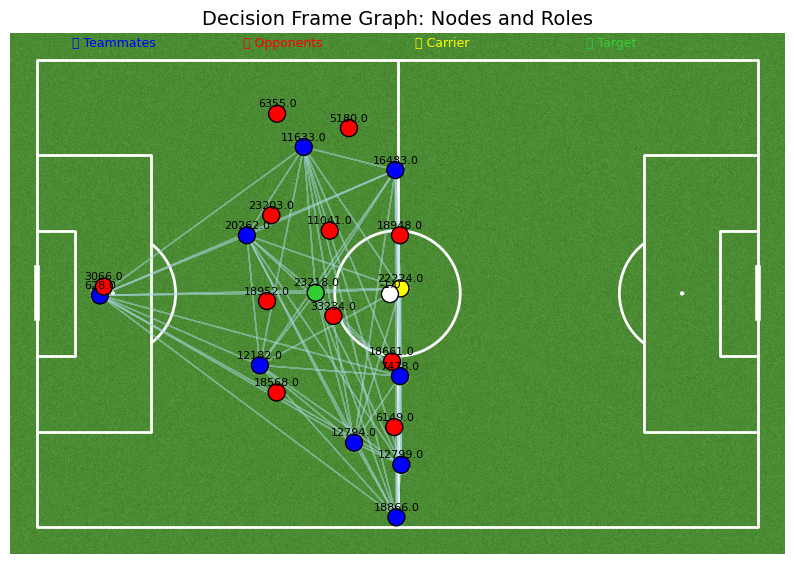

In [91]:
pyg_data = to_pyg_data(g)
visualize_scene_graph(g)

In [96]:
import plotly.graph_objects as go

def visualize_scene_graph_plotly(g: dict, pitch_length=105, pitch_width=68):
    """
    Fully interactive version using Plotly.
    """
    pos = g["nodes"][:, :2]
    is_ball = g["is_ball"]
    player_ids = g["player_ids"]
    vx, vy = g["nodes"][:, 2], g["nodes"][:, 3]

    x, y = pos[:, 0], pos[:, 1]
    carrier_idx = np.where(g["nodes"][:, 6] == 1)[0][0]
    target_idx = g["target_index"]

    # Colors
    team_colors = []
    for i in range(len(pos)):
        if is_ball[i]:
            team_colors.append("white")
        elif g["nodes"][i, 6] == 1:
            team_colors.append("yellow")
        elif i == target_idx:
            team_colors.append("limegreen")
        elif g["nodes"][i, 5] == 1:
            team_colors.append("blue")
        else:
            team_colors.append("red")

    # Node hover info
    hover_text = [
        f"Player ID: {int(pid)}<br>"
        f"Velocity: ({vx[i]:.2f}, {vy[i]:.2f}) m/s<br>"
        f"{'Ball' if is_ball[i] else ('Carrier' if g['nodes'][i,6]==1 else ('Target' if i==target_idx else 'Player'))}"
        for i, pid in enumerate(player_ids)
    ]

    # Create figure
    fig = go.Figure()

    # Add pitch background
    fig.update_layout(
        width=900, height=600,
        plot_bgcolor="green",
        xaxis=dict(range=[0, pitch_length], showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(range=[0, pitch_width], showgrid=False, zeroline=False, showticklabels=False),
        title="Interactive Scene Graph (Plotly)",
    )

    # Add player nodes
    fig.add_trace(go.Scatter(
        x=x, y=y, mode="markers+text",
        marker=dict(size=14, color=team_colors, line=dict(color="black", width=1)),
        text=[str(pid) for pid in player_ids],
        textposition="top center",
        hovertext=hover_text,
        hoverinfo="text"
    ))

    # Add teammate-to-teammate arrows
    for s, r in zip(g["senders"], g["receivers"]):
        if g["nodes"][s, 5] == 1 and g["nodes"][r, 5] == 1:
            fig.add_annotation(
                x=x[r], y=y[r], ax=x[s], ay=y[s],
                showarrow=True, arrowhead=3, arrowsize=1, arrowwidth=1,
                opacity=0.3, arrowcolor="lightblue"
            )

    fig.show()


In [97]:
visualize_scene_graph_plotly(g)


### Step 1 — Load Match Metadata

We start by loading the list of available matches in our dataset.  
Each match will be processed independently to extract *decision frames* — the key frames where the player in possession is about to make a pass or decision.


In [112]:
import json
from pathlib import Path
import pandas as pd

matches_file = ROOT / "matches.parquet"

if not matches_file.exists():
    rows = []
    for fpath in DYNAMIC_DIR.glob("*.parquet"):
        match_id = int(fpath.stem)
        meta_path = META_DIR / f"{match_id}.json"
        home_team = away_team = None
        if meta_path.exists():
            with open(meta_path, "r") as f:
                meta = json.load(f)
            home_team = meta["home_team"]["name"]
            away_team = meta["away_team"]["name"]
        rows.append({"id": match_id, "home_team": home_team, "away_team": away_team})
    df_matches = pd.DataFrame(rows)
    df_matches.to_parquet(matches_file, index=False)
else:
    df_matches = pd.read_parquet(matches_file)

print(f"✅ Matches loaded: {len(df_matches)}")
display(df_matches.head())


✅ Matches loaded: 378


,id,home_team,away_team
0,1986708,Crystal Palace,Brentford FC
1,1715920,Tottenham Hotspur,Arsenal Football Club
2,2015001,West Ham United,Tottenham Hotspur
3,1650385,Manchester United,Fulham
4,2007863,Leicester City,Manchester United


### Step 2 — What Are Decision Frames?

A *decision frame* is the moment just before a pass (usually 2 frames before `frame_end` of a possession).  
For each match, we have a corresponding `*_decisions.parquet` file saved in the folder `graph_inputs_decisions/`.

Each decision file contains **all players + the ball** for that exact frame, plus metadata like:
- `player_in_possession_id`
- `player_targeted_id`
- `pass_outcome` (success or fail)
- and positional/velocity data for each player.

We’ll now combine these decision frames across all matches into a large dataset.


### Extract Decision Frames for All Matches

In this section, we’ll automate the process of generating **decision-frame data** for *every match* in our dataset.

Each decision frame represents a snapshot right before a player makes a pass or key action.

The goal:
- Compute player velocities
- Select valid decision moments (2 frames before a pass)
- Save per-match `.parquet` files containing all player + ball information at those decision frames


In [113]:
def extract_decision_frames_for_match(match_id: int):
    """
    Extract decision frames (2 frames before each pass) for one match.
    Saves results as {match_id}_decisions.parquet in OUT_DIR.
    """
    print(f"Processing match {match_id} ...")

    tr_path = PROCESSED_DIR / f"{match_id}.parquet"
    ev_path = DYNAMIC_DIR / f"{match_id}.parquet"
    if not tr_path.exists() or not ev_path.exists():
        print(f"⚠️ Missing data for {match_id}")
        return False

    tr = pd.read_parquet(tr_path)
    ev = pd.read_parquet(ev_path)

    # Filter for valid tracking frames
    tr = tr[(tr["ball_in_play"]) & tr[["x_norm", "y_norm"]].notna().all(axis=1)].copy()
    tr["match_id"] = tr["match_id"].astype(int)
    ev["match_id"] = ev["match_id"].astype(int)

    # Ensure period datatypes align
    if ev["period"].dtype != tr["period"].dtype:
        ev["period"] = ev["period"].astype(str).replace({"101": "1", "102": "2"}).astype(int)

    # Compute velocities
    tr = (
        tr.groupby("player_id", group_keys=False)
          .apply(lambda df: compute_velocities_per_player(df, FPS))
    )
    tr["team_id"] = tr["team_id"].fillna(-1).astype(int)

    # Filter events for player possessions
    pos = ev[ev["event_type"] == "player_possession"].copy()
    if pos.empty:
        print(f"⚠️ No player_possession events for {match_id}")
        return False

    keep_ev_cols = [
        "match_id","period","frame_start","frame_end","team_id",
        "player_id","end_type","player_targeted_id","pass_outcome",
        "lead_to_shot","lead_to_goal"
    ]
    pos = pos[[c for c in keep_ev_cols if c in pos.columns]].copy()
    pos = pos.rename(columns={"player_id": "player_in_possession_id"})
    pos["decision_frame"] = (pos["frame_end"] - SAFETY_FRAMES).clip(lower=pos["frame_start"]).astype(int)

    # Merge decision frames with tracking
    frames_of_interest = pos[["match_id","period","decision_frame"]].drop_duplicates()
    frames_of_interest = frames_of_interest.rename(columns={"decision_frame":"frame"})
    tr_dec = tr.merge(frames_of_interest, on=["match_id","period","frame"], how="inner")

    # Keep only frames with full 22 players + 1 ball
    counts = tr_dec.groupby(["match_id","period","frame"]).agg(
        n_players=("player_id","nunique"),
        n_ball=("is_ball","sum")
    ).reset_index()
    valid_frames = counts[(counts["n_players"] >= 22) & (counts["n_ball"] == 1)][["match_id","period","frame"]]
    tr_dec = tr_dec.merge(valid_frames, on=["match_id","period","frame"], how="inner")

    # Merge event labels
    dec_labels = pos.rename(columns={"decision_frame":"frame"})
    dec_labels = dec_labels[[
        "match_id","period","frame","team_id","player_in_possession_id",
        "end_type","player_targeted_id","pass_outcome","lead_to_shot","lead_to_goal"
    ]]
    tr_dec = tr_dec.merge(dec_labels, on=["match_id","period","frame"], how="left", suffixes=("", "_event"))
    tr_dec["team_id"] = tr_dec["team_id"].fillna(tr_dec["team_id_event"])
    tr_dec.drop(columns=[c for c in tr_dec.columns if c.endswith("_event")], inplace=True)

    # Infer carrier if missing
    def infer_carrier(tr_frame):
        if not tr_frame["is_ball"].any():
            return np.nan
        bx, by = tr_frame.loc[tr_frame["is_ball"], ["x_norm","y_norm"]].iloc[0]
        team_in_pos = tr_frame["in_possession_team"].iloc[0]
        team_players = tr_frame[(tr_frame["team_id"] == team_in_pos) & (~tr_frame["is_ball"])]
        if team_players.empty:
            return np.nan
        dists = np.sqrt((team_players["x_norm"] - bx)**2 + (team_players["y_norm"] - by)**2)
        return team_players.loc[dists.idxmin(), "player_id"]

    missing_mask = tr_dec["player_in_possession_id"].isna()
    if missing_mask.any():
        inferred_carriers = (
            tr_dec[missing_mask]
            .groupby(["match_id","period","frame"], group_keys=False)
            .apply(infer_carrier)
            .rename("inferred_carrier")
            .reset_index()
        )
        tr_dec = tr_dec.merge(inferred_carriers, on=["match_id","period","frame"], how="left")
        tr_dec["player_in_possession_id"].fillna(tr_dec["inferred_carrier"], inplace=True)
        tr_dec.drop(columns="inferred_carrier", inplace=True)

    # Select final columns
    keep_tr_cols = [
        "match_id","period","frame","team_id","player_id","is_ball",
        "x_norm","y_norm","vx","vy","in_possession_team"
    ]
    keep_lbl_cols = [
        "player_in_possession_id","end_type","player_targeted_id",
        "pass_outcome","lead_to_shot","lead_to_goal"
    ]
    cols = [c for c in keep_tr_cols + keep_lbl_cols if c in tr_dec.columns]
    tr_dec = tr_dec[cols].copy()

    # Save
    outpath = OUT_DIR / f"{match_id}_decisions.parquet"
    tr_dec.to_parquet(outpath, index=False)
    print(f"💾 Saved {match_id} → {outpath.name} ✅ ({len(tr_dec)} rows)")
    return True



### Process All Matches

We now loop over every available match in our `matches.parquet` file  
and extract decision-frame datasets for each of them.

This step can take several minutes depending on how many matches you have.


In [114]:
from tqdm import tqdm

success = 0
for match_id in tqdm(df_matches["id"].tolist(), desc="Extracting decision frames"):
    ok = extract_decision_frames_for_match(match_id)
    if ok:
        success += 1

print(f"\n✅ Successfully processed {success}/{len(df_matches)} matches")


Extracting decision frames:   0%|          | 0/378 [00:00<?, ?it/s]

Processing match 1986708 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   0%|          | 1/378 [00:01<09:29,  1.51s/it]

💾 Saved 1986708 → 1986708_decisions.parquet ✅ (17411 rows)
Processing match 1715920 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   1%|          | 2/378 [00:02<09:02,  1.44s/it]

💾 Saved 1715920 → 1715920_decisions.parquet ✅ (19941 rows)
Processing match 2015001 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   1%|          | 3/378 [00:04<08:35,  1.37s/it]

💾 Saved 2015001 → 2015001_decisions.parquet ✅ (18492 rows)
Processing match 1650385 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   1%|          | 4/378 [00:05<08:22,  1.34s/it]

💾 Saved 1650385 → 1650385_decisions.parquet ✅ (21758 rows)
Processing match 2007863 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   1%|▏         | 5/378 [00:06<08:32,  1.37s/it]

💾 Saved 2007863 → 2007863_decisions.parquet ✅ (24587 rows)
Processing match 1939716 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   2%|▏         | 6/378 [00:08<08:47,  1.42s/it]

💾 Saved 1939716 → 1939716_decisions.parquet ✅ (25760 rows)
Processing match 2003493 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   2%|▏         | 7/378 [00:09<08:46,  1.42s/it]

💾 Saved 2003493 → 2003493_decisions.parquet ✅ (22425 rows)
Processing match 1972418 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   2%|▏         | 8/378 [00:11<08:40,  1.41s/it]

💾 Saved 1972418 → 1972418_decisions.parquet ✅ (18975 rows)
Processing match 1666921 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   2%|▏         | 9/378 [00:12<08:36,  1.40s/it]

💾 Saved 1666921 → 1666921_decisions.parquet ✅ (23437 rows)
Processing match 1968375 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   3%|▎         | 10/378 [00:13<08:32,  1.39s/it]

💾 Saved 1968375 → 1968375_decisions.parquet ✅ (23690 rows)
Processing match 1711918 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   3%|▎         | 11/378 [00:15<08:37,  1.41s/it]

💾 Saved 1711918 → 1711918_decisions.parquet ✅ (18952 rows)
Processing match 1934789 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   3%|▎         | 12/378 [00:16<08:47,  1.44s/it]

💾 Saved 1934789 → 1934789_decisions.parquet ✅ (21459 rows)
Processing match 1889315 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   3%|▎         | 13/378 [00:18<08:23,  1.38s/it]

💾 Saved 1889315 → 1889315_decisions.parquet ✅ (20447 rows)
Processing match 2016344 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   4%|▎         | 14/378 [00:19<08:26,  1.39s/it]

💾 Saved 2016344 → 2016344_decisions.parquet ✅ (23023 rows)
Processing match 1949358 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   4%|▍         | 15/378 [00:21<08:25,  1.39s/it]

💾 Saved 1949358 → 1949358_decisions.parquet ✅ (24380 rows)
Processing match 2004170 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   4%|▍         | 16/378 [00:22<08:18,  1.38s/it]

💾 Saved 2004170 → 2004170_decisions.parquet ✅ (21620 rows)
Processing match 2003328 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   4%|▍         | 17/378 [00:23<08:14,  1.37s/it]

💾 Saved 2003328 → 2003328_decisions.parquet ✅ (23506 rows)
Processing match 2009785 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   5%|▍         | 18/378 [00:25<08:14,  1.37s/it]

💾 Saved 2009785 → 2009785_decisions.parquet ✅ (26082 rows)
Processing match 1895417 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   5%|▌         | 19/378 [00:25<06:44,  1.13s/it]

💾 Saved 1895417 → 1895417_decisions.parquet ✅ (8602 rows)
Processing match 1766990 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   5%|▌         | 20/378 [00:27<07:09,  1.20s/it]

💾 Saved 1766990 → 1766990_decisions.parquet ✅ (25990 rows)
Processing match 1729518 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   6%|▌         | 21/378 [00:28<07:21,  1.24s/it]

💾 Saved 1729518 → 1729518_decisions.parquet ✅ (22149 rows)
Processing match 1651703 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   6%|▌         | 22/378 [00:28<05:57,  1.01s/it]

💾 Saved 1651703 → 1651703_decisions.parquet ✅ (6900 rows)
Processing match 1897173 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   6%|▌         | 23/378 [00:30<06:35,  1.11s/it]

💾 Saved 1897173 → 1897173_decisions.parquet ✅ (22103 rows)
Processing match 2018576 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   6%|▋         | 24/378 [00:31<07:01,  1.19s/it]

💾 Saved 2018576 → 2018576_decisions.parquet ✅ (20539 rows)
Processing match 2007484 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   7%|▋         | 25/378 [00:32<07:18,  1.24s/it]

💾 Saved 2007484 → 2007484_decisions.parquet ✅ (24702 rows)
Processing match 1832953 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   7%|▋         | 26/378 [00:34<07:28,  1.27s/it]

💾 Saved 1832953 → 1832953_decisions.parquet ✅ (23184 rows)
Processing match 2012232 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   7%|▋         | 27/378 [00:35<07:36,  1.30s/it]

💾 Saved 2012232 → 2012232_decisions.parquet ✅ (20332 rows)
Processing match 1997068 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   7%|▋         | 28/378 [00:36<07:44,  1.33s/it]

💾 Saved 1997068 → 1997068_decisions.parquet ✅ (21965 rows)
Processing match 1912994 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   8%|▊         | 29/378 [00:38<07:53,  1.36s/it]

💾 Saved 1912994 → 1912994_decisions.parquet ✅ (23437 rows)
Processing match 2017700 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   8%|▊         | 30/378 [00:39<07:46,  1.34s/it]

💾 Saved 2017700 → 2017700_decisions.parquet ✅ (21528 rows)
Processing match 1917682 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   8%|▊         | 31/378 [00:41<07:52,  1.36s/it]

💾 Saved 1917682 → 1917682_decisions.parquet ✅ (21344 rows)
Processing match 2004876 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   8%|▊         | 32/378 [00:42<08:12,  1.42s/it]

💾 Saved 2004876 → 2004876_decisions.parquet ✅ (21390 rows)
Processing match 1985287 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   9%|▊         | 33/378 [00:44<08:07,  1.41s/it]

💾 Saved 1985287 → 1985287_decisions.parquet ✅ (23437 rows)
Processing match 1941551 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   9%|▉         | 34/378 [00:45<08:09,  1.42s/it]

💾 Saved 1941551 → 1941551_decisions.parquet ✅ (20562 rows)
Processing match 1846874 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:   9%|▉         | 35/378 [00:46<07:59,  1.40s/it]

💾 Saved 1846874 → 1846874_decisions.parquet ✅ (21988 rows)
Processing match 2004438 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  10%|▉         | 36/378 [00:48<08:18,  1.46s/it]

💾 Saved 2004438 → 2004438_decisions.parquet ✅ (20171 rows)
Processing match 1666917 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  10%|▉         | 37/378 [00:49<08:12,  1.44s/it]

💾 Saved 1666917 → 1666917_decisions.parquet ✅ (20355 rows)
Processing match 2006399 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  10%|█         | 38/378 [00:51<07:57,  1.40s/it]

💾 Saved 2006399 → 2006399_decisions.parquet ✅ (19343 rows)
Processing match 2014723 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  10%|█         | 39/378 [00:52<07:52,  1.39s/it]

💾 Saved 2014723 → 2014723_decisions.parquet ✅ (25507 rows)
Processing match 1766989 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  11%|█         | 40/378 [00:53<07:45,  1.38s/it]

💾 Saved 1766989 → 1766989_decisions.parquet ✅ (22908 rows)
Processing match 1887117 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  11%|█         | 41/378 [00:55<07:52,  1.40s/it]

💾 Saved 1887117 → 1887117_decisions.parquet ✅ (23644 rows)
Processing match 1925318 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  11%|█         | 42/378 [00:56<07:43,  1.38s/it]

💾 Saved 1925318 → 1925318_decisions.parquet ✅ (23276 rows)
Processing match 2012233 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  11%|█▏        | 43/378 [00:58<07:37,  1.37s/it]

💾 Saved 2012233 → 2012233_decisions.parquet ✅ (24219 rows)
Processing match 1832952 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  12%|█▏        | 44/378 [00:59<07:07,  1.28s/it]

💾 Saved 1832952 → 1832952_decisions.parquet ✅ (15318 rows)
Processing match 2004877 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  12%|█▏        | 45/378 [01:00<07:35,  1.37s/it]

💾 Saved 2004877 → 2004877_decisions.parquet ✅ (23368 rows)
Processing match 1941550 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  12%|█▏        | 46/378 [01:02<07:34,  1.37s/it]

💾 Saved 1941550 → 1941550_decisions.parquet ✅ (26726 rows)
Processing match 1668692 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  12%|█▏        | 47/378 [01:03<07:41,  1.40s/it]

💾 Saved 1668692 → 1668692_decisions.parquet ✅ (19734 rows)
Processing match 2017701 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  13%|█▎        | 48/378 [01:05<07:53,  1.43s/it]

💾 Saved 2017701 → 2017701_decisions.parquet ✅ (22149 rows)
Processing match 1912995 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  13%|█▎        | 49/378 [01:06<07:46,  1.42s/it]

💾 Saved 1912995 → 1912995_decisions.parquet ✅ (22770 rows)
Processing match 2012598 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  13%|█▎        | 50/378 [01:07<07:36,  1.39s/it]

💾 Saved 2012598 → 2012598_decisions.parquet ✅ (20424 rows)
Processing match 2006398 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  13%|█▎        | 51/378 [01:09<07:39,  1.40s/it]

💾 Saved 2006398 → 2006398_decisions.parquet ✅ (24242 rows)
Processing match 1846875 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  14%|█▍        | 52/378 [01:10<07:38,  1.41s/it]

💾 Saved 1846875 → 1846875_decisions.parquet ✅ (22402 rows)
Processing match 2011368 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  14%|█▍        | 53/378 [01:11<07:36,  1.40s/it]

💾 Saved 2011368 → 2011368_decisions.parquet ✅ (22701 rows)
Processing match 2004168 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  14%|█▍        | 54/378 [01:13<07:02,  1.30s/it]

💾 Saved 2004168 → 2004168_decisions.parquet ✅ (17917 rows)
Processing match 1887116 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  15%|█▍        | 55/378 [01:14<07:10,  1.33s/it]

💾 Saved 1887116 → 1887116_decisions.parquet ✅ (19619 rows)
Processing match 1803128 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  15%|█▍        | 56/378 [01:15<07:20,  1.37s/it]

💾 Saved 1803128 → 1803128_decisions.parquet ✅ (23138 rows)
Processing match 1766988 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  15%|█▌        | 57/378 [01:17<07:21,  1.37s/it]

💾 Saved 1766988 → 1766988_decisions.parquet ✅ (23460 rows)
Processing match 2010323 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  15%|█▌        | 58/378 [01:18<07:16,  1.36s/it]

💾 Saved 2010323 → 2010323_decisions.parquet ✅ (20815 rows)
Processing match 2003330 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  16%|█▌        | 59/378 [01:20<07:16,  1.37s/it]

💾 Saved 2003330 → 2003330_decisions.parquet ✅ (22034 rows)
Processing match 1900298 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  16%|█▌        | 60/378 [01:21<07:05,  1.34s/it]

💾 Saved 1900298 → 1900298_decisions.parquet ✅ (23115 rows)
Processing match 2003492 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  16%|█▌        | 61/378 [01:22<07:05,  1.34s/it]

💾 Saved 2003492 → 2003492_decisions.parquet ✅ (23575 rows)
Processing match 1887120 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  16%|█▋        | 62/378 [01:24<07:19,  1.39s/it]

💾 Saved 1887120 → 1887120_decisions.parquet ✅ (21482 rows)
Processing match 1986709 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  17%|█▋        | 63/378 [01:25<07:15,  1.38s/it]

💾 Saved 1986709 → 1986709_decisions.parquet ✅ (21873 rows)
Processing match 2015000 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  17%|█▋        | 64/378 [01:26<07:20,  1.40s/it]

💾 Saved 2015000 → 2015000_decisions.parquet ✅ (20240 rows)
Processing match 2010636 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  17%|█▋        | 65/378 [01:28<07:14,  1.39s/it]

💾 Saved 2010636 → 2010636_decisions.parquet ✅ (23391 rows)
Processing match 1968374 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  17%|█▋        | 66/378 [01:29<07:15,  1.40s/it]

💾 Saved 1968374 → 1968374_decisions.parquet ✅ (25806 rows)
Processing match 2004054 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  18%|█▊        | 67/378 [01:31<07:10,  1.39s/it]

💾 Saved 2004054 → 2004054_decisions.parquet ✅ (20401 rows)
Processing match 2011150 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  18%|█▊        | 68/378 [01:32<07:15,  1.41s/it]

💾 Saved 2011150 → 2011150_decisions.parquet ✅ (25645 rows)
Processing match 2015490 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  18%|█▊        | 69/378 [01:33<07:15,  1.41s/it]

💾 Saved 2015490 → 2015490_decisions.parquet ✅ (20401 rows)
Processing match 2011870 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  19%|█▊        | 70/378 [01:35<07:17,  1.42s/it]

💾 Saved 2011870 → 2011870_decisions.parquet ✅ (21712 rows)
Processing match 1666920 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  19%|█▉        | 71/378 [01:36<07:15,  1.42s/it]

💾 Saved 1666920 → 1666920_decisions.parquet ✅ (23368 rows)
Processing match 1972419 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  19%|█▉        | 72/378 [01:38<07:07,  1.40s/it]

💾 Saved 1972419 → 1972419_decisions.parquet ✅ (20746 rows)
Processing match 2004974 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  19%|█▉        | 73/378 [01:38<05:57,  1.17s/it]

💾 Saved 2004974 → 2004974_decisions.parquet ✅ (9430 rows)
Processing match 2004171 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  20%|█▉        | 74/378 [01:40<06:16,  1.24s/it]

💾 Saved 2004171 → 2004171_decisions.parquet ✅ (21689 rows)
Processing match 2016345 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  20%|█▉        | 75/378 [01:41<06:35,  1.30s/it]

💾 Saved 2016345 → 2016345_decisions.parquet ✅ (24058 rows)
Processing match 1895416 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  20%|██        | 76/378 [01:43<06:43,  1.33s/it]

💾 Saved 1895416 → 1895416_decisions.parquet ✅ (22057 rows)
Processing match 1766991 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  20%|██        | 77/378 [01:44<06:44,  1.34s/it]

💾 Saved 1766991 → 1766991_decisions.parquet ✅ (20010 rows)
Processing match 1817721 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  21%|██        | 78/378 [01:45<06:50,  1.37s/it]

💾 Saved 1817721 → 1817721_decisions.parquet ✅ (23874 rows)
Processing match 2009784 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  21%|██        | 79/378 [01:47<06:58,  1.40s/it]

💾 Saved 2009784 → 2009784_decisions.parquet ✅ (21022 rows)
Processing match 2003329 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  21%|██        | 80/378 [01:48<06:54,  1.39s/it]

💾 Saved 2003329 → 2003329_decisions.parquet ✅ (21551 rows)
Processing match 2005099 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  21%|██▏       | 81/378 [01:50<06:52,  1.39s/it]

💾 Saved 2005099 → 2005099_decisions.parquet ✅ (27508 rows)
Processing match 1889314 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  22%|██▏       | 82/378 [01:51<06:47,  1.38s/it]

💾 Saved 1889314 → 1889314_decisions.parquet ✅ (24840 rows)
Processing match 1934788 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  22%|██▏       | 83/378 [01:52<06:45,  1.37s/it]

💾 Saved 1934788 → 1934788_decisions.parquet ✅ (21298 rows)
Processing match 2018577 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  22%|██▏       | 84/378 [01:54<06:46,  1.38s/it]

💾 Saved 2018577 → 2018577_decisions.parquet ✅ (20930 rows)
Processing match 2005042 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  22%|██▏       | 85/378 [01:55<06:50,  1.40s/it]

💾 Saved 2005042 → 2005042_decisions.parquet ✅ (23161 rows)
Processing match 1897172 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  23%|██▎       | 86/378 [01:56<06:44,  1.39s/it]

💾 Saved 1897172 → 1897172_decisions.parquet ✅ (18561 rows)
Processing match 2013344 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  23%|██▎       | 87/378 [01:58<06:45,  1.39s/it]

💾 Saved 2013344 → 2013344_decisions.parquet ✅ (22356 rows)
Processing match 1651702 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  23%|██▎       | 88/378 [01:59<06:10,  1.28s/it]

💾 Saved 1651702 → 1651702_decisions.parquet ✅ (14122 rows)
Processing match 1941552 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  24%|██▎       | 89/378 [02:00<06:23,  1.33s/it]

💾 Saved 1941552 → 1941552_decisions.parquet ✅ (23138 rows)
Processing match 2004875 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  24%|██▍       | 90/378 [02:02<06:45,  1.41s/it]

💾 Saved 2004875 → 2004875_decisions.parquet ✅ (25254 rows)
Processing match 1912997 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  24%|██▍       | 91/378 [02:03<06:43,  1.41s/it]

💾 Saved 1912997 → 1912997_decisions.parquet ✅ (23920 rows)
Processing match 1934150 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  24%|██▍       | 92/378 [02:05<06:41,  1.40s/it]

💾 Saved 1934150 → 1934150_decisions.parquet ✅ (24058 rows)
Processing match 1747407 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  25%|██▍       | 93/378 [02:06<06:45,  1.42s/it]

💾 Saved 1747407 → 1747407_decisions.parquet ✅ (21482 rows)
Processing match 2001338 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  25%|██▍       | 94/378 [02:08<06:39,  1.41s/it]

💾 Saved 2001338 → 2001338_decisions.parquet ✅ (21712 rows)
Processing match 1653146 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  25%|██▌       | 95/378 [02:09<06:33,  1.39s/it]

💾 Saved 1653146 → 1653146_decisions.parquet ✅ (20884 rows)
Processing match 1799222 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  25%|██▌       | 96/378 [02:10<06:00,  1.28s/it]

💾 Saved 1799222 → 1799222_decisions.parquet ✅ (14582 rows)
Processing match 1770289 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  26%|██▌       | 97/378 [02:11<06:09,  1.32s/it]

💾 Saved 1770289 → 1770289_decisions.parquet ✅ (19343 rows)
Processing match 1683029 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  26%|██▌       | 98/378 [02:13<06:20,  1.36s/it]

💾 Saved 1683029 → 1683029_decisions.parquet ✅ (23621 rows)
Processing match 1832950 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  26%|██▌       | 99/378 [02:13<05:22,  1.16s/it]

💾 Saved 1832950 → 1832950_decisions.parquet ✅ (10074 rows)
Processing match 1951174 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  26%|██▋       | 100/378 [02:15<05:45,  1.24s/it]

💾 Saved 1951174 → 1951174_decisions.parquet ✅ (20516 rows)
Processing match 2017367 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  27%|██▋       | 101/378 [02:17<06:25,  1.39s/it]

💾 Saved 2017367 → 2017367_decisions.parquet ✅ (21022 rows)
Processing match 1806021 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  27%|██▋       | 102/378 [02:18<06:38,  1.44s/it]

💾 Saved 1806021 → 1806021_decisions.parquet ✅ (22103 rows)
Processing match 1847631 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  27%|██▋       | 103/378 [02:20<06:40,  1.46s/it]

💾 Saved 1847631 → 1847631_decisions.parquet ✅ (25852 rows)
Processing match 1873889 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  28%|██▊       | 104/378 [02:21<06:38,  1.45s/it]

💾 Saved 1873889 → 1873889_decisions.parquet ✅ (23851 rows)
Processing match 2011202 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  28%|██▊       | 105/378 [02:23<06:32,  1.44s/it]

💾 Saved 2011202 → 2011202_decisions.parquet ✅ (19113 rows)
Processing match 1712849 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  28%|██▊       | 106/378 [02:24<06:27,  1.42s/it]

💾 Saved 1712849 → 1712849_decisions.parquet ✅ (20240 rows)
Processing match 1999190 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  28%|██▊       | 107/378 [02:25<06:23,  1.42s/it]

💾 Saved 1999190 → 1999190_decisions.parquet ✅ (23207 rows)
Processing match 2009695 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  29%|██▊       | 108/378 [02:27<06:22,  1.42s/it]

💾 Saved 2009695 → 2009695_decisions.parquet ✅ (24495 rows)
Processing match 1915033 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  29%|██▉       | 109/378 [02:28<06:27,  1.44s/it]

💾 Saved 1915033 → 1915033_decisions.parquet ✅ (23805 rows)
Processing match 1770290 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  29%|██▉       | 110/378 [02:29<05:59,  1.34s/it]

💾 Saved 1770290 → 1770290_decisions.parquet ✅ (16974 rows)
Processing match 1666922 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  29%|██▉       | 111/378 [02:31<06:03,  1.36s/it]

💾 Saved 1666922 → 1666922_decisions.parquet ✅ (23299 rows)
Processing match 1832949 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  30%|██▉       | 112/378 [02:32<06:11,  1.40s/it]

💾 Saved 1832949 → 1832949_decisions.parquet ✅ (22632 rows)
Processing match 1927295 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  30%|██▉       | 113/378 [02:34<06:09,  1.39s/it]

💾 Saved 1927295 → 1927295_decisions.parquet ✅ (20769 rows)
Processing match 1939715 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  30%|███       | 114/378 [02:35<06:17,  1.43s/it]

💾 Saved 1939715 → 1939715_decisions.parquet ✅ (20884 rows)
Processing match 1976820 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  30%|███       | 115/378 [02:37<06:14,  1.42s/it]

💾 Saved 1976820 → 1976820_decisions.parquet ✅ (22885 rows)
Processing match 1713834 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  31%|███       | 116/378 [02:38<06:10,  1.41s/it]

💾 Saved 1713834 → 1713834_decisions.parquet ✅ (24219 rows)
Processing match 1751820 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  31%|███       | 117/378 [02:39<05:09,  1.19s/it]

💾 Saved 1751820 → 1751820_decisions.parquet ✅ (10994 rows)
Processing match 2018575 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  31%|███       | 118/378 [02:39<04:31,  1.04s/it]

💾 Saved 2018575 → 2018575_decisions.parquet ✅ (11155 rows)
Processing match 2003157 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  31%|███▏      | 119/378 [02:41<04:56,  1.15s/it]

💾 Saved 2003157 → 2003157_decisions.parquet ✅ (25254 rows)
Processing match 1651700 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  32%|███▏      | 120/378 [02:42<05:20,  1.24s/it]

💾 Saved 1651700 → 1651700_decisions.parquet ✅ (19895 rows)
Processing match 2010154 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  32%|███▏      | 121/378 [02:44<05:30,  1.29s/it]

💾 Saved 2010154 → 2010154_decisions.parquet ✅ (16629 rows)
Processing match 1712850 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  32%|███▏      | 122/378 [02:45<05:44,  1.35s/it]

💾 Saved 1712850 → 1712850_decisions.parquet ✅ (21712 rows)
Processing match 2009828 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  33%|███▎      | 123/378 [02:46<05:48,  1.37s/it]

💾 Saved 2009828 → 2009828_decisions.parquet ✅ (20999 rows)
Processing match 2005040 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  33%|███▎      | 124/378 [02:48<05:51,  1.38s/it]

💾 Saved 2005040 → 2005040_decisions.parquet ✅ (23230 rows)
Processing match 1999189 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  33%|███▎      | 125/378 [02:49<05:44,  1.36s/it]

💾 Saved 1999189 → 1999189_decisions.parquet ✅ (21367 rows)
Processing match 1832248 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  33%|███▎      | 126/378 [02:51<05:56,  1.42s/it]

💾 Saved 1832248 → 1832248_decisions.parquet ✅ (19596 rows)
Processing match 2009786 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  34%|███▎      | 127/378 [02:52<06:02,  1.45s/it]

💾 Saved 2009786 → 2009786_decisions.parquet ✅ (21160 rows)
Processing match 1766993 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  34%|███▍      | 128/378 [02:54<06:02,  1.45s/it]

💾 Saved 1766993 → 1766993_decisions.parquet ✅ (22609 rows)
Processing match 1895414 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  34%|███▍      | 129/378 [02:55<06:00,  1.45s/it]

💾 Saved 1895414 → 1895414_decisions.parquet ✅ (20884 rows)
Processing match 1849276 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  34%|███▍      | 130/378 [02:57<05:58,  1.44s/it]

💾 Saved 1849276 → 1849276_decisions.parquet ✅ (21091 rows)
Processing match 2004173 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  35%|███▍      | 131/378 [02:58<05:59,  1.45s/it]

💾 Saved 2004173 → 2004173_decisions.parquet ✅ (21666 rows)
Processing match 1915753 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  35%|███▍      | 132/378 [03:00<05:56,  1.45s/it]

💾 Saved 1915753 → 1915753_decisions.parquet ✅ (21275 rows)
Processing match 1873890 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  35%|███▌      | 133/378 [03:01<05:57,  1.46s/it]

💾 Saved 1873890 → 1873890_decisions.parquet ✅ (22816 rows)
Processing match 2014780 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  35%|███▌      | 134/378 [03:02<05:51,  1.44s/it]

💾 Saved 2014780 → 2014780_decisions.parquet ✅ (21252 rows)
Processing match 2012907 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  36%|███▌      | 135/378 [03:04<05:52,  1.45s/it]

💾 Saved 2012907 → 2012907_decisions.parquet ✅ (25323 rows)
Processing match 1832948 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  36%|███▌      | 136/378 [03:05<05:46,  1.43s/it]

💾 Saved 1832948 → 1832948_decisions.parquet ✅ (20171 rows)
Processing match 2003931 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  36%|███▌      | 137/378 [03:07<05:44,  1.43s/it]

💾 Saved 2003931 → 2003931_decisions.parquet ✅ (21045 rows)
Processing match 1967223 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  37%|███▋      | 138/378 [03:08<05:38,  1.41s/it]

💾 Saved 1967223 → 1967223_decisions.parquet ✅ (23046 rows)
Processing match 1945190 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  37%|███▋      | 139/378 [03:09<05:38,  1.42s/it]

💾 Saved 1945190 → 1945190_decisions.parquet ✅ (23391 rows)
Processing match 1886376 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  37%|███▋      | 140/378 [03:11<05:49,  1.47s/it]

💾 Saved 1886376 → 1886376_decisions.parquet ✅ (22908 rows)
Processing match 2006304 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  37%|███▋      | 141/378 [03:12<05:43,  1.45s/it]

💾 Saved 2006304 → 2006304_decisions.parquet ✅ (21482 rows)
Processing match 2018580 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  38%|███▊      | 142/378 [03:14<05:34,  1.42s/it]

💾 Saved 2018580 → 2018580_decisions.parquet ✅ (21436 rows)
Processing match 1903346 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  38%|███▊      | 143/378 [03:16<05:52,  1.50s/it]

💾 Saved 1903346 → 1903346_decisions.parquet ✅ (22471 rows)
Processing match 1939714 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  38%|███▊      | 144/378 [03:17<05:47,  1.49s/it]

💾 Saved 1939714 → 1939714_decisions.parquet ✅ (23046 rows)
Processing match 1927294 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  38%|███▊      | 145/378 [03:18<05:37,  1.45s/it]

💾 Saved 1927294 → 1927294_decisions.parquet ✅ (22379 rows)
Processing match 1651701 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  39%|███▊      | 146/378 [03:20<05:30,  1.42s/it]

💾 Saved 1651701 → 1651701_decisions.parquet ✅ (19412 rows)
Processing match 2005041 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  39%|███▉      | 147/378 [03:21<05:28,  1.42s/it]

💾 Saved 2005041 → 2005041_decisions.parquet ✅ (19849 rows)
Processing match 2018574 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  39%|███▉      | 148/378 [03:22<04:59,  1.30s/it]

💾 Saved 2018574 → 2018574_decisions.parquet ✅ (17595 rows)
Processing match 1800187 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  39%|███▉      | 149/378 [03:23<04:03,  1.06s/it]

💾 Saved 1800187 → 1800187_decisions.parquet ✅ (7038 rows)
Processing match 1849277 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  40%|███▉      | 150/378 [03:24<04:26,  1.17s/it]

💾 Saved 1849277 → 1849277_decisions.parquet ✅ (24633 rows)
Processing match 1766992 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  40%|███▉      | 151/378 [03:26<04:46,  1.26s/it]

💾 Saved 1766992 → 1766992_decisions.parquet ✅ (20700 rows)
Processing match 1895415 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  40%|████      | 152/378 [03:27<04:54,  1.30s/it]

💾 Saved 1895415 → 1895415_decisions.parquet ✅ (19895 rows)
Processing match 2010414 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  40%|████      | 153/378 [03:28<05:02,  1.35s/it]

💾 Saved 2010414 → 2010414_decisions.parquet ✅ (23552 rows)
Processing match 2009787 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  41%|████      | 154/378 [03:30<05:08,  1.38s/it]

💾 Saved 2009787 → 2009787_decisions.parquet ✅ (22563 rows)
Processing match 2012757 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  41%|████      | 155/378 [03:31<05:13,  1.41s/it]

💾 Saved 2012757 → 2012757_decisions.parquet ✅ (19504 rows)
Processing match 2004172 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  41%|████▏     | 156/378 [03:33<05:12,  1.41s/it]

💾 Saved 2004172 → 2004172_decisions.parquet ✅ (20769 rows)
Processing match 1912996 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  42%|████▏     | 157/378 [03:33<03:57,  1.07s/it]

💾 Saved 1912996 → 1912996_decisions.parquet ✅ (3174 rows)
Processing match 1650961 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  42%|████▏     | 158/378 [03:34<04:21,  1.19s/it]

💾 Saved 1650961 → 1650961_decisions.parquet ✅ (22080 rows)
Processing match 1832951 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  42%|████▏     | 159/378 [03:36<04:39,  1.27s/it]

💾 Saved 1832951 → 1832951_decisions.parquet ✅ (23000 rows)
Processing match 1683028 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  42%|████▏     | 160/378 [03:37<04:50,  1.33s/it]

💾 Saved 1683028 → 1683028_decisions.parquet ✅ (19090 rows)
Processing match 1770288 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  43%|████▎     | 161/378 [03:39<04:52,  1.35s/it]

💾 Saved 1770288 → 1770288_decisions.parquet ✅ (21413 rows)
Processing match 1951175 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  43%|████▎     | 162/378 [03:40<04:58,  1.38s/it]

💾 Saved 1951175 → 1951175_decisions.parquet ✅ (22402 rows)
Processing match 1799223 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  43%|████▎     | 163/378 [03:41<04:47,  1.34s/it]

💾 Saved 1799223 → 1799223_decisions.parquet ✅ (18607 rows)
Processing match 2015068 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  43%|████▎     | 164/378 [03:43<04:53,  1.37s/it]

💾 Saved 2015068 → 2015068_decisions.parquet ✅ (23529 rows)
Processing match 1847630 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  44%|████▎     | 165/378 [03:44<04:59,  1.41s/it]

💾 Saved 1847630 → 1847630_decisions.parquet ✅ (22908 rows)
Processing match 1681563 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  44%|████▍     | 166/378 [03:46<04:59,  1.41s/it]

💾 Saved 1681563 → 1681563_decisions.parquet ✅ (25553 rows)
Processing match 1873888 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  44%|████▍     | 167/378 [03:46<04:07,  1.17s/it]

💾 Saved 1873888 → 1873888_decisions.parquet ✅ (9085 rows)
Processing match 1766002 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  44%|████▍     | 168/378 [03:48<04:26,  1.27s/it]

💾 Saved 1766002 → 1766002_decisions.parquet ✅ (22977 rows)
Processing match 1835431 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  45%|████▍     | 169/378 [03:49<04:35,  1.32s/it]

💾 Saved 1835431 → 1835431_decisions.parquet ✅ (21551 rows)
Processing match 2011203 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  45%|████▍     | 170/378 [03:51<04:45,  1.37s/it]

💾 Saved 2011203 → 2011203_decisions.parquet ✅ (20677 rows)
Processing match 1879054 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  45%|████▌     | 171/378 [03:52<04:46,  1.39s/it]

💾 Saved 1879054 → 1879054_decisions.parquet ✅ (25047 rows)
Processing match 2009694 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  46%|████▌     | 172/378 [03:54<04:46,  1.39s/it]

💾 Saved 2009694 → 2009694_decisions.parquet ✅ (23230 rows)
Processing match 1999191 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  46%|████▌     | 173/378 [03:55<04:54,  1.44s/it]

💾 Saved 1999191 → 1999191_decisions.parquet ✅ (21597 rows)
Processing match 1729513 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  46%|████▌     | 174/378 [03:57<04:54,  1.44s/it]

💾 Saved 1729513 → 1729513_decisions.parquet ✅ (23575 rows)
Processing match 1681566 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  46%|████▋     | 175/378 [03:58<04:51,  1.43s/it]

💾 Saved 1681566 → 1681566_decisions.parquet ✅ (18262 rows)
Processing match 1730528 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  47%|████▋     | 176/378 [04:00<04:57,  1.47s/it]

💾 Saved 1730528 → 1730528_decisions.parquet ✅ (20677 rows)
Processing match 1934787 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  47%|████▋     | 177/378 [04:00<04:13,  1.26s/it]

💾 Saved 1934787 → 1934787_decisions.parquet ✅ (12857 rows)
Processing match 2007737 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  47%|████▋     | 178/378 [04:02<04:17,  1.29s/it]

💾 Saved 2007737 → 2007737_decisions.parquet ✅ (23966 rows)
Processing match 1680834 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  47%|████▋     | 179/378 [04:03<04:26,  1.34s/it]

💾 Saved 1680834 → 1680834_decisions.parquet ✅ (20470 rows)
Processing match 2010325 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  48%|████▊     | 180/378 [04:05<04:35,  1.39s/it]

💾 Saved 2010325 → 2010325_decisions.parquet ✅ (23046 rows)
Processing match 2003326 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  48%|████▊     | 181/378 [04:05<03:50,  1.17s/it]

💾 Saved 2003326 → 2003326_decisions.parquet ✅ (10235 rows)
Processing match 1846873 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  48%|████▊     | 182/378 [04:07<03:46,  1.16s/it]

💾 Saved 1846873 → 1846873_decisions.parquet ✅ (18446 rows)
Processing match 2012372 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  48%|████▊     | 183/378 [04:08<04:02,  1.24s/it]

💾 Saved 2012372 → 2012372_decisions.parquet ✅ (23391 rows)
Processing match 1729516 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  49%|████▊     | 184/378 [04:09<04:14,  1.31s/it]

💾 Saved 1729516 → 1729516_decisions.parquet ✅ (23552 rows)
Processing match 2011443 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  49%|████▉     | 185/378 [04:11<04:19,  1.35s/it]

💾 Saved 2011443 → 2011443_decisions.parquet ✅ (22310 rows)
Processing match 2018578 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  49%|████▉     | 186/378 [04:12<04:23,  1.37s/it]

💾 Saved 2018578 → 2018578_decisions.parquet ✅ (22172 rows)
Processing match 1816810 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  49%|████▉     | 187/378 [04:14<04:29,  1.41s/it]

💾 Saved 1816810 → 1816810_decisions.parquet ✅ (26680 rows)
Processing match 1819621 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  50%|████▉     | 188/378 [04:15<04:36,  1.45s/it]

💾 Saved 1819621 → 1819621_decisions.parquet ✅ (23506 rows)
Processing match 1876099 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  50%|█████     | 189/378 [04:17<04:38,  1.48s/it]

💾 Saved 1876099 → 1876099_decisions.parquet ✅ (23782 rows)
Processing match 2011600 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  50%|█████     | 190/378 [04:18<04:37,  1.47s/it]

💾 Saved 2011600 → 2011600_decisions.parquet ✅ (20401 rows)
Processing match 1900297 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  51%|█████     | 191/378 [04:20<04:35,  1.47s/it]

💾 Saved 1900297 → 1900297_decisions.parquet ✅ (21597 rows)
Processing match 1669604 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  51%|█████     | 192/378 [04:21<04:30,  1.46s/it]

💾 Saved 1669604 → 1669604_decisions.parquet ✅ (23943 rows)
Processing match 1985290 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  51%|█████     | 193/378 [04:23<04:32,  1.47s/it]

💾 Saved 1985290 → 1985290_decisions.parquet ✅ (26243 rows)
Processing match 2006586 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  51%|█████▏    | 194/378 [04:24<04:27,  1.45s/it]

💾 Saved 2006586 → 2006586_decisions.parquet ✅ (21988 rows)
Processing match 1654741 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  52%|█████▏    | 195/378 [04:26<04:27,  1.46s/it]

💾 Saved 1654741 → 1654741_decisions.parquet ✅ (25093 rows)
Processing match 1888593 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  52%|█████▏    | 196/378 [04:27<04:25,  1.46s/it]

💾 Saved 1888593 → 1888593_decisions.parquet ✅ (23391 rows)
Processing match 1711920 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  52%|█████▏    | 197/378 [04:29<04:20,  1.44s/it]

💾 Saved 1711920 → 1711920_decisions.parquet ✅ (20700 rows)
Processing match 2012175 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  52%|█████▏    | 198/378 [04:29<03:50,  1.28s/it]

💾 Saved 2012175 → 2012175_decisions.parquet ✅ (15410 rows)
Processing match 2011367 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  53%|█████▎    | 199/378 [04:31<03:59,  1.34s/it]

💾 Saved 2011367 → 2011367_decisions.parquet ✅ (19665 rows)
Processing match 2010150 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  53%|█████▎    | 200/378 [04:32<04:00,  1.35s/it]

💾 Saved 2010150 → 2010150_decisions.parquet ✅ (20010 rows)
Processing match 2013342 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  53%|█████▎    | 201/378 [04:34<04:06,  1.39s/it]

💾 Saved 2013342 → 2013342_decisions.parquet ✅ (22264 rows)
Processing match 2018571 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  53%|█████▎    | 202/378 [04:35<04:05,  1.40s/it]

💾 Saved 2018571 → 2018571_decisions.parquet ✅ (19228 rows)
Processing match 2007483 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  54%|█████▎    | 203/378 [04:37<04:07,  1.42s/it]

💾 Saved 2007483 → 2007483_decisions.parquet ✅ (20401 rows)
Processing match 1972420 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  54%|█████▍    | 204/378 [04:38<04:07,  1.42s/it]

💾 Saved 1972420 → 1972420_decisions.parquet ✅ (23046 rows)
Processing match 1666919 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  54%|█████▍    | 205/378 [04:40<04:06,  1.42s/it]

💾 Saved 1666919 → 1666919_decisions.parquet ✅ (24817 rows)
Processing match 2006397 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  54%|█████▍    | 206/378 [04:41<04:10,  1.46s/it]

💾 Saved 2006397 → 2006397_decisions.parquet ✅ (20355 rows)
Processing match 1969492 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  55%|█████▍    | 207/378 [04:42<04:07,  1.44s/it]

💾 Saved 1969492 → 1969492_decisions.parquet ✅ (24472 rows)
Processing match 2016516 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  55%|█████▌    | 208/378 [04:43<03:18,  1.17s/it]

💾 Saved 2016516 → 2016516_decisions.parquet ✅ (7452 rows)
Processing match 2004167 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  55%|█████▌    | 209/378 [04:45<03:36,  1.28s/it]

💾 Saved 2004167 → 2004167_decisions.parquet ✅ (22839 rows)
Processing match 2016343 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  56%|█████▌    | 210/378 [04:46<03:41,  1.32s/it]

💾 Saved 2016343 → 2016343_decisions.parquet ✅ (18837 rows)
Processing match 1887119 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  56%|█████▌    | 211/378 [04:47<03:48,  1.37s/it]

💾 Saved 1887119 → 1887119_decisions.parquet ✅ (17181 rows)
Processing match 2014999 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  56%|█████▌    | 212/378 [04:49<03:52,  1.40s/it]

💾 Saved 2014999 → 2014999_decisions.parquet ✅ (22126 rows)
Processing match 1968372 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  56%|█████▋    | 213/378 [04:50<03:58,  1.44s/it]

💾 Saved 1968372 → 1968372_decisions.parquet ✅ (20010 rows)
Processing match 1925317 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  57%|█████▋    | 214/378 [04:52<04:03,  1.49s/it]

💾 Saved 1925317 → 1925317_decisions.parquet ✅ (23759 rows)
Processing match 1997066 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  57%|█████▋    | 215/378 [04:54<04:04,  1.50s/it]

💾 Saved 1997066 → 1997066_decisions.parquet ✅ (23069 rows)
Processing match 1729520 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  57%|█████▋    | 216/378 [04:55<03:56,  1.46s/it]

💾 Saved 1729520 → 1729520_decisions.parquet ✅ (23207 rows)
Processing match 1997729 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  57%|█████▋    | 217/378 [04:56<03:58,  1.48s/it]

💾 Saved 1997729 → 1997729_decisions.parquet ✅ (20125 rows)
Processing match 1949360 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  58%|█████▊    | 218/378 [04:58<03:53,  1.46s/it]

💾 Saved 1949360 → 1949360_decisions.parquet ✅ (22264 rows)
Processing match 1936645 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  58%|█████▊    | 219/378 [04:59<03:50,  1.45s/it]

💾 Saved 1936645 → 1936645_decisions.parquet ✅ (24518 rows)
Processing match 2004878 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  58%|█████▊    | 220/378 [05:01<03:49,  1.45s/it]

💾 Saved 2004878 → 2004878_decisions.parquet ✅ (17756 rows)
Processing match 1893581 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  58%|█████▊    | 221/378 [05:02<03:44,  1.43s/it]

💾 Saved 1893581 → 1893581_decisions.parquet ✅ (23161 rows)
Processing match 1939711 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  59%|█████▊    | 222/378 [05:04<03:44,  1.44s/it]

💾 Saved 1939711 → 1939711_decisions.parquet ✅ (24725 rows)
Processing match 1927291 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  59%|█████▉    | 223/378 [05:05<03:45,  1.46s/it]

💾 Saved 1927291 → 1927291_decisions.parquet ✅ (25576 rows)
Processing match 1985289 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  59%|█████▉    | 224/378 [05:07<03:48,  1.48s/it]

💾 Saved 1985289 → 1985289_decisions.parquet ✅ (23759 rows)
Processing match 1837900 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  60%|█████▉    | 225/378 [05:08<03:57,  1.55s/it]

💾 Saved 1837900 → 1837900_decisions.parquet ✅ (23897 rows)
Processing match 1666918 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  60%|█████▉    | 226/378 [05:10<03:54,  1.54s/it]

💾 Saved 1666918 → 1666918_decisions.parquet ✅ (20746 rows)
Processing match 1972421 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  60%|██████    | 227/378 [05:11<03:39,  1.45s/it]

💾 Saved 1972421 → 1972421_decisions.parquet ✅ (21896 rows)
Processing match 2007482 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  60%|██████    | 228/378 [05:13<03:39,  1.46s/it]

💾 Saved 2007482 → 2007482_decisions.parquet ✅ (19159 rows)
Processing match 2006396 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  61%|██████    | 229/378 [05:14<03:35,  1.45s/it]

💾 Saved 2006396 → 2006396_decisions.parquet ✅ (22678 rows)
Processing match 2004437 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  61%|██████    | 230/378 [05:16<03:43,  1.51s/it]

💾 Saved 2004437 → 2004437_decisions.parquet ✅ (24794 rows)
Processing match 1711921 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  61%|██████    | 231/378 [05:17<03:32,  1.44s/it]

💾 Saved 1711921 → 1711921_decisions.parquet ✅ (20999 rows)
Processing match 2013343 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  61%|██████▏   | 232/378 [05:18<03:33,  1.46s/it]

💾 Saved 2013343 → 2013343_decisions.parquet ✅ (25990 rows)
Processing match 2010151 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  62%|██████▏   | 233/378 [05:20<03:20,  1.39s/it]

💾 Saved 2010151 → 2010151_decisions.parquet ✅ (18400 rows)
Processing match 1904770 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  62%|██████▏   | 234/378 [05:21<03:23,  1.42s/it]

💾 Saved 1904770 → 1904770_decisions.parquet ✅ (19780 rows)
Processing match 2016342 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  62%|██████▏   | 235/378 [05:23<03:29,  1.47s/it]

💾 Saved 2016342 → 2016342_decisions.parquet ✅ (21942 rows)
Processing match 1715919 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  62%|██████▏   | 236/378 [05:24<03:28,  1.47s/it]

💾 Saved 1715919 → 1715919_decisions.parquet ✅ (21574 rows)
Processing match 2009783 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  63%|██████▎   | 237/378 [05:26<03:24,  1.45s/it]

💾 Saved 2009783 → 2009783_decisions.parquet ✅ (21298 rows)
Processing match 2014169 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  63%|██████▎   | 238/378 [05:27<03:22,  1.45s/it]

💾 Saved 2014169 → 2014169_decisions.parquet ✅ (18239 rows)
Processing match 1887118 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  63%|██████▎   | 239/378 [05:29<03:22,  1.46s/it]

💾 Saved 1887118 → 1887118_decisions.parquet ✅ (20424 rows)
Processing match 1873885 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  63%|██████▎   | 240/378 [05:30<03:23,  1.47s/it]

💾 Saved 1873885 → 1873885_decisions.parquet ✅ (21965 rows)
Processing match 1889313 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  64%|██████▍   | 241/378 [05:32<03:23,  1.49s/it]

💾 Saved 1889313 → 1889313_decisions.parquet ✅ (23437 rows)
Processing match 1968373 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  64%|██████▍   | 242/378 [05:33<03:18,  1.46s/it]

💾 Saved 1968373 → 1968373_decisions.parquet ✅ (21298 rows)
Processing match 1997067 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  64%|██████▍   | 243/378 [05:34<03:15,  1.45s/it]

💾 Saved 1997067 → 1997067_decisions.parquet ✅ (20838 rows)
Processing match 1966655 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  65%|██████▍   | 244/378 [05:36<03:14,  1.45s/it]

💾 Saved 1966655 → 1966655_decisions.parquet ✅ (20654 rows)
Processing match 2004973 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  65%|██████▍   | 245/378 [05:37<03:13,  1.46s/it]

💾 Saved 2004973 → 2004973_decisions.parquet ✅ (22333 rows)
Processing match 1901785 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  65%|██████▌   | 246/378 [05:39<03:13,  1.46s/it]

💾 Saved 1901785 → 1901785_decisions.parquet ✅ (19251 rows)
Processing match 1893580 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  65%|██████▌   | 247/378 [05:40<03:16,  1.50s/it]

💾 Saved 1893580 → 1893580_decisions.parquet ✅ (24058 rows)
Processing match 1985288 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  66%|██████▌   | 248/378 [05:42<03:12,  1.48s/it]

💾 Saved 1985288 → 1985288_decisions.parquet ✅ (18147 rows)
Processing match 1834552 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  66%|██████▌   | 249/378 [05:43<03:09,  1.47s/it]

💾 Saved 1834552 → 1834552_decisions.parquet ✅ (19619 rows)
Processing match 1949361 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  66%|██████▌   | 250/378 [05:45<03:04,  1.44s/it]

💾 Saved 1949361 → 1949361_decisions.parquet ✅ (23805 rows)
Processing match 1949357 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  66%|██████▋   | 251/378 [05:46<03:05,  1.46s/it]

💾 Saved 1949357 → 1949357_decisions.parquet ✅ (23621 rows)
Processing match 2003327 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  67%|██████▋   | 252/378 [05:48<03:02,  1.45s/it]

💾 Saved 2003327 → 2003327_decisions.parquet ✅ (23207 rows)
Processing match 2010324 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  67%|██████▋   | 253/378 [05:49<02:59,  1.44s/it]

💾 Saved 2010324 → 2010324_decisions.parquet ✅ (23000 rows)
Processing match 2007736 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  67%|██████▋   | 254/378 [05:50<02:56,  1.43s/it]

💾 Saved 2007736 → 2007736_decisions.parquet ✅ (21390 rows)
Processing match 1657085 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  67%|██████▋   | 255/378 [05:52<02:56,  1.44s/it]

💾 Saved 1657085 → 1657085_decisions.parquet ✅ (24035 rows)
Processing match 1934786 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  68%|██████▊   | 256/378 [05:53<02:56,  1.44s/it]

💾 Saved 1934786 → 1934786_decisions.parquet ✅ (23874 rows)
Processing match 2017924 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  68%|██████▊   | 257/378 [05:55<02:55,  1.45s/it]

💾 Saved 2017924 → 2017924_decisions.parquet ✅ (22540 rows)
Processing match 1925976 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  68%|██████▊   | 258/378 [05:56<02:54,  1.45s/it]

💾 Saved 1925976 → 1925976_decisions.parquet ✅ (19734 rows)
Processing match 1816811 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  69%|██████▊   | 259/378 [05:58<02:52,  1.45s/it]

💾 Saved 1816811 → 1816811_decisions.parquet ✅ (22264 rows)
Processing match 2018579 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  69%|██████▉   | 260/378 [05:59<02:47,  1.42s/it]

💾 Saved 2018579 → 2018579_decisions.parquet ✅ (19619 rows)
Processing match 1819620 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  69%|██████▉   | 261/378 [06:00<02:46,  1.42s/it]

💾 Saved 1819620 → 1819620_decisions.parquet ✅ (20999 rows)
Processing match 2014832 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  69%|██████▉   | 262/378 [06:02<02:49,  1.46s/it]

💾 Saved 2014832 → 2014832_decisions.parquet ✅ (21942 rows)
Processing match 1987415 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  70%|██████▉   | 263/378 [06:04<02:51,  1.49s/it]

💾 Saved 1987415 → 1987415_decisions.parquet ✅ (23690 rows)
Processing match 1729517 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  70%|██████▉   | 264/378 [06:05<02:47,  1.47s/it]

💾 Saved 1729517 → 1729517_decisions.parquet ✅ (19895 rows)
Processing match 1846872 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  70%|███████   | 265/378 [06:06<02:44,  1.46s/it]

💾 Saved 1846872 → 1846872_decisions.parquet ✅ (19734 rows)
Processing match 2011442 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  70%|███████   | 266/378 [06:08<02:42,  1.45s/it]

💾 Saved 2011442 → 2011442_decisions.parquet ✅ (21988 rows)
Processing match 1900296 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  71%|███████   | 267/378 [06:09<02:40,  1.44s/it]

💾 Saved 1900296 → 1900296_decisions.parquet ✅ (22287 rows)
Processing match 1985291 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  71%|███████   | 268/378 [06:11<02:37,  1.43s/it]

💾 Saved 1985291 → 1985291_decisions.parquet ✅ (22494 rows)
Processing match 1669605 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  71%|███████   | 269/378 [06:12<02:37,  1.44s/it]

💾 Saved 1669605 → 1669605_decisions.parquet ✅ (20539 rows)
Processing match 1999980 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  71%|███████▏  | 270/378 [06:14<02:36,  1.45s/it]

💾 Saved 1999980 → 1999980_decisions.parquet ✅ (20861 rows)
Processing match 1986707 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  72%|███████▏  | 271/378 [06:15<02:38,  1.48s/it]

💾 Saved 1986707 → 1986707_decisions.parquet ✅ (20470 rows)
Processing match 2009901 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  72%|███████▏  | 272/378 [06:17<02:39,  1.50s/it]

💾 Saved 2009901 → 2009901_decisions.parquet ✅ (22057 rows)
Processing match 2013552 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  72%|███████▏  | 273/378 [06:18<02:22,  1.35s/it]

💾 Saved 2013552 → 2013552_decisions.parquet ✅ (13248 rows)
Processing match 1934145 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  72%|███████▏  | 274/378 [06:19<02:29,  1.43s/it]

💾 Saved 1934145 → 1934145_decisions.parquet ✅ (22126 rows)
Processing match 1747412 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  73%|███████▎  | 275/378 [06:21<02:27,  1.43s/it]

💾 Saved 1747412 → 1747412_decisions.parquet ✅ (22011 rows)
Processing match 1895413 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  73%|███████▎  | 276/378 [06:22<02:27,  1.45s/it]

💾 Saved 1895413 → 1895413_decisions.parquet ✅ (20171 rows)
Processing match 1951807 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  73%|███████▎  | 277/378 [06:24<02:29,  1.48s/it]

💾 Saved 1951807 → 1951807_decisions.parquet ✅ (18699 rows)
Processing match 2016515 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  74%|███████▎  | 278/378 [06:25<02:26,  1.47s/it]

💾 Saved 2016515 → 2016515_decisions.parquet ✅ (19090 rows)
Processing match 1915754 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  74%|███████▍  | 279/378 [06:27<02:28,  1.50s/it]

💾 Saved 1915754 → 1915754_decisions.parquet ✅ (25070 rows)
Processing match 1666058 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  74%|███████▍  | 280/378 [06:28<02:26,  1.49s/it]

💾 Saved 1666058 → 1666058_decisions.parquet ✅ (23621 rows)
Processing match 1800191 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  74%|███████▍  | 281/378 [06:30<02:27,  1.52s/it]

💾 Saved 1800191 → 1800191_decisions.parquet ✅ (24173 rows)
Processing match 1974371 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  75%|███████▍  | 282/378 [06:31<02:28,  1.54s/it]

💾 Saved 1974371 → 1974371_decisions.parquet ✅ (21574 rows)
Processing match 2018572 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  75%|███████▍  | 283/378 [06:33<02:23,  1.51s/it]

💾 Saved 2018572 → 2018572_decisions.parquet ✅ (23253 rows)
Processing match 1712847 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  75%|███████▌  | 284/378 [06:35<02:25,  1.55s/it]

💾 Saved 1712847 → 1712847_decisions.parquet ✅ (22379 rows)
Processing match 2012176 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  75%|███████▌  | 285/378 [06:35<02:00,  1.30s/it]

💾 Saved 2012176 → 2012176_decisions.parquet ✅ (9913 rows)
Processing match 2013341 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  76%|███████▌  | 286/378 [06:36<01:40,  1.09s/it]

💾 Saved 2013341 → 2013341_decisions.parquet ✅ (7935 rows)
Processing match 2010153 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  76%|███████▌  | 287/378 [06:37<01:51,  1.22s/it]

💾 Saved 2010153 → 2010153_decisions.parquet ✅ (20838 rows)
Processing match 2006400 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  76%|███████▌  | 288/378 [06:39<01:56,  1.29s/it]

💾 Saved 2006400 → 2006400_decisions.parquet ✅ (23437 rows)
Processing match 1927292 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  76%|███████▋  | 289/378 [06:40<01:57,  1.32s/it]

💾 Saved 1927292 → 1927292_decisions.parquet ✅ (20953 rows)
Processing match 1939712 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  77%|███████▋  | 290/378 [06:42<01:58,  1.35s/it]

💾 Saved 1939712 → 1939712_decisions.parquet ✅ (20493 rows)
Processing match 1747409 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  77%|███████▋  | 291/378 [06:43<01:59,  1.37s/it]

💾 Saved 1747409 → 1747409_decisions.parquet ✅ (22977 rows)
Processing match 1949363 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  77%|███████▋  | 292/378 [06:45<02:04,  1.44s/it]

💾 Saved 1949363 → 1949363_decisions.parquet ✅ (20976 rows)
Processing match 1874585 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  78%|███████▊  | 293/378 [06:46<01:49,  1.28s/it]

💾 Saved 1874585 → 1874585_decisions.parquet ✅ (14007 rows)
Processing match 1936646 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  78%|███████▊  | 294/378 [06:47<01:52,  1.33s/it]

💾 Saved 1936646 → 1936646_decisions.parquet ✅ (21390 rows)
Processing match 1997065 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  78%|███████▊  | 295/378 [06:49<01:54,  1.38s/it]

💾 Saved 1997065 → 1997065_decisions.parquet ✅ (23092 rows)
Processing match 1815119 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  78%|███████▊  | 296/378 [06:50<01:54,  1.40s/it]

💾 Saved 1815119 → 1815119_decisions.parquet ✅ (21643 rows)
Processing match 1915034 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  79%|███████▊  | 297/378 [06:51<01:54,  1.41s/it]

💾 Saved 1915034 → 1915034_decisions.parquet ✅ (21988 rows)
Processing match 2003007 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  79%|███████▉  | 298/378 [06:53<01:55,  1.44s/it]

💾 Saved 2003007 → 2003007_decisions.parquet ✅ (21206 rows)
Processing match 1683027 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  79%|███████▉  | 299/378 [06:54<01:54,  1.45s/it]

💾 Saved 1683027 → 1683027_decisions.parquet ✅ (23667 rows)
Processing match 1967225 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  79%|███████▉  | 300/378 [06:56<01:53,  1.45s/it]

💾 Saved 1967225 → 1967225_decisions.parquet ✅ (18906 rows)
Processing match 2014830 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  80%|███████▉  | 301/378 [06:57<01:52,  1.46s/it]

💾 Saved 2014830 → 2014830_decisions.parquet ✅ (20677 rows)
Processing match 1974368 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  80%|███████▉  | 302/378 [06:59<01:48,  1.43s/it]

💾 Saved 1974368 → 1974368_decisions.parquet ✅ (26289 rows)
Processing match 2018120 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  80%|████████  | 303/378 [07:00<01:47,  1.44s/it]

💾 Saved 2018120 → 2018120_decisions.parquet ✅ (21712 rows)
Processing match 1819622 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  80%|████████  | 304/378 [07:02<01:47,  1.46s/it]

💾 Saved 1819622 → 1819622_decisions.parquet ✅ (19596 rows)
Processing match 2017698 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  81%|████████  | 305/378 [07:03<01:45,  1.45s/it]

💾 Saved 2017698 → 2017698_decisions.parquet ✅ (20263 rows)
Processing match 1816813 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  81%|████████  | 306/378 [07:04<01:43,  1.43s/it]

💾 Saved 1816813 → 1816813_decisions.parquet ✅ (18883 rows)
Processing match 1925974 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  81%|████████  | 307/378 [07:06<01:42,  1.44s/it]

💾 Saved 1925974 → 1925974_decisions.parquet ✅ (23092 rows)
Processing match 2011205 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  81%|████████▏ | 308/378 [07:07<01:42,  1.47s/it]

💾 Saved 2011205 → 2011205_decisions.parquet ✅ (22517 rows)
Processing match 2007558 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  82%|████████▏ | 309/378 [07:09<01:40,  1.45s/it]

💾 Saved 2007558 → 2007558_decisions.parquet ✅ (21137 rows)
Processing match 1902568 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  82%|████████▏ | 310/378 [07:10<01:38,  1.44s/it]

💾 Saved 1902568 → 1902568_decisions.parquet ✅ (20148 rows)
Processing match 2012371 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  82%|████████▏ | 311/378 [07:11<01:19,  1.18s/it]

💾 Saved 2012371 → 2012371_decisions.parquet ✅ (8717 rows)
Processing match 1729515 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  83%|████████▎ | 312/378 [07:12<01:23,  1.26s/it]

💾 Saved 1729515 → 1729515_decisions.parquet ✅ (21551 rows)
Processing match 1849278 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  83%|████████▎ | 313/378 [07:14<01:28,  1.36s/it]

💾 Saved 1849278 → 1849278_decisions.parquet ✅ (22356 rows)
Processing match 1680837 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  83%|████████▎ | 314/378 [07:15<01:17,  1.22s/it]

💾 Saved 1680837 → 1680837_decisions.parquet ✅ (9798 rows)
Processing match 2003325 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  83%|████████▎ | 315/378 [07:16<01:23,  1.33s/it]

💾 Saved 2003325 → 2003325_decisions.parquet ✅ (21988 rows)
Processing match 1800188 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  84%|████████▎ | 316/378 [07:18<01:25,  1.38s/it]

💾 Saved 1800188 → 1800188_decisions.parquet ✅ (22080 rows)
Processing match 1681565 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  84%|████████▍ | 317/378 [07:19<01:27,  1.44s/it]

💾 Saved 1681565 → 1681565_decisions.parquet ✅ (22517 rows)
Processing match 2016627 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  84%|████████▍ | 318/378 [07:21<01:26,  1.45s/it]

💾 Saved 2016627 → 2016627_decisions.parquet ✅ (19228 rows)
Processing match 1953619 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  84%|████████▍ | 319/378 [07:22<01:25,  1.44s/it]

💾 Saved 1953619 → 1953619_decisions.parquet ✅ (22770 rows)
Processing match 2006585 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  85%|████████▍ | 320/378 [07:24<01:24,  1.45s/it]

💾 Saved 2006585 → 2006585_decisions.parquet ✅ (23897 rows)
Processing match 2006857 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  85%|████████▍ | 321/378 [07:25<01:25,  1.49s/it]

💾 Saved 2006857 → 2006857_decisions.parquet ✅ (22241 rows)
Processing match 1747410 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  85%|████████▌ | 322/378 [07:27<01:23,  1.49s/it]

💾 Saved 1747410 → 1747410_decisions.parquet ✅ (23184 rows)
Processing match 1934147 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  85%|████████▌ | 323/378 [07:27<01:06,  1.20s/it]

💾 Saved 1934147 → 1934147_decisions.parquet ✅ (6095 rows)
Processing match 1732598 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  86%|████████▌ | 324/378 [07:28<00:58,  1.08s/it]

💾 Saved 1732598 → 1732598_decisions.parquet ✅ (10350 rows)
Processing match 1748495 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  86%|████████▌ | 325/378 [07:30<01:04,  1.21s/it]

💾 Saved 1748495 → 1748495_decisions.parquet ✅ (21896 rows)
Processing match 2011204 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  86%|████████▌ | 326/378 [07:31<01:06,  1.28s/it]

💾 Saved 2011204 → 2011204_decisions.parquet ✅ (18998 rows)
Processing match 1729514 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  87%|████████▋ | 327/378 [07:33<01:07,  1.33s/it]

💾 Saved 1729514 → 1729514_decisions.parquet ✅ (22287 rows)
Processing match 2012370 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  87%|████████▋ | 328/378 [07:34<01:11,  1.43s/it]

💾 Saved 2012370 → 2012370_decisions.parquet ✅ (22724 rows)
Processing match 2009693 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  87%|████████▋ | 329/378 [07:36<01:13,  1.50s/it]

💾 Saved 2009693 → 2009693_decisions.parquet ✅ (24518 rows)
Processing match 1819623 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  87%|████████▋ | 330/378 [07:38<01:13,  1.52s/it]

💾 Saved 1819623 → 1819623_decisions.parquet ✅ (22494 rows)
Processing match 1970055 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  88%|████████▊ | 331/378 [07:39<01:11,  1.53s/it]

💾 Saved 1970055 → 1970055_decisions.parquet ✅ (21551 rows)
Processing match 2018121 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  88%|████████▊ | 332/378 [07:40<01:03,  1.38s/it]

💾 Saved 2018121 → 2018121_decisions.parquet ✅ (18814 rows)
Processing match 1974369 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  88%|████████▊ | 333/378 [07:42<01:04,  1.42s/it]

💾 Saved 1974369 → 1974369_decisions.parquet ✅ (22655 rows)
Processing match 2014831 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  88%|████████▊ | 334/378 [07:43<01:02,  1.42s/it]

💾 Saved 2014831 → 2014831_decisions.parquet ✅ (20792 rows)
Processing match 1816812 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  89%|████████▊ | 335/378 [07:44<00:57,  1.33s/it]

💾 Saved 1816812 → 1816812_decisions.parquet ✅ (16238 rows)
Processing match 1925975 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  89%|████████▉ | 336/378 [07:46<00:57,  1.36s/it]

💾 Saved 1925975 → 1925975_decisions.parquet ✅ (21344 rows)
Processing match 2017699 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  89%|████████▉ | 337/378 [07:47<00:57,  1.40s/it]

💾 Saved 2017699 → 2017699_decisions.parquet ✅ (18538 rows)
Processing match 1800189 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  89%|████████▉ | 338/378 [07:48<00:51,  1.30s/it]

💾 Saved 1800189 → 1800189_decisions.parquet ✅ (16997 rows)
Processing match 1681564 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  90%|████████▉ | 339/378 [07:50<00:52,  1.35s/it]

💾 Saved 1681564 → 1681564_decisions.parquet ✅ (17664 rows)
Processing match 1680836 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  90%|████████▉ | 340/378 [07:51<00:52,  1.38s/it]

💾 Saved 1680836 → 1680836_decisions.parquet ✅ (23437 rows)
Processing match 1849279 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  90%|█████████ | 341/378 [07:53<00:52,  1.43s/it]

💾 Saved 1849279 → 1849279_decisions.parquet ✅ (20953 rows)
Processing match 2016626 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  90%|█████████ | 342/378 [07:54<00:48,  1.35s/it]

💾 Saved 2016626 → 2016626_decisions.parquet ✅ (17411 rows)
Processing match 2013551 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  91%|█████████ | 343/378 [07:55<00:47,  1.36s/it]

💾 Saved 2013551 → 2013551_decisions.parquet ✅ (20010 rows)
Processing match 1934146 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  91%|█████████ | 344/378 [07:57<00:47,  1.41s/it]

💾 Saved 1934146 → 1934146_decisions.parquet ✅ (26174 rows)
Processing match 1732599 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  91%|█████████▏| 345/378 [07:58<00:46,  1.40s/it]

💾 Saved 1732599 → 1732599_decisions.parquet ✅ (18078 rows)
Processing match 1747411 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  92%|█████████▏| 346/378 [08:00<00:46,  1.46s/it]

💾 Saved 1747411 → 1747411_decisions.parquet ✅ (22793 rows)
Processing match 1748494 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  92%|█████████▏| 347/378 [08:01<00:46,  1.51s/it]

💾 Saved 1748494 → 1748494_decisions.parquet ✅ (23529 rows)
Processing match 2006584 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  92%|█████████▏| 348/378 [08:03<00:44,  1.48s/it]

💾 Saved 2006584 → 2006584_decisions.parquet ✅ (21988 rows)
Processing match 1985292 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  92%|█████████▏| 349/378 [08:03<00:36,  1.25s/it]

💾 Saved 1985292 → 1985292_decisions.parquet ✅ (8694 rows)
Processing match 1900295 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  93%|█████████▎| 350/378 [08:05<00:36,  1.30s/it]

💾 Saved 1900295 → 1900295_decisions.parquet ✅ (20263 rows)
Processing match 1800190 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  93%|█████████▎| 351/378 [08:07<00:38,  1.42s/it]

💾 Saved 1800190 → 1800190_decisions.parquet ✅ (22379 rows)
Processing match 1873886 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  93%|█████████▎| 352/378 [08:08<00:38,  1.49s/it]

💾 Saved 1873886 → 1873886_decisions.parquet ✅ (21781 rows)
Processing match 2017368 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  93%|█████████▎| 353/378 [08:10<00:37,  1.49s/it]

💾 Saved 2017368 → 2017368_decisions.parquet ✅ (21459 rows)
Processing match 2003245 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  94%|█████████▎| 354/378 [08:11<00:35,  1.49s/it]

💾 Saved 2003245 → 2003245_decisions.parquet ✅ (19826 rows)
Processing match 1895412 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  94%|█████████▍| 355/378 [08:13<00:34,  1.52s/it]

💾 Saved 1895412 → 1895412_decisions.parquet ✅ (22954 rows)
Processing match 2016341 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  94%|█████████▍| 356/378 [08:14<00:32,  1.46s/it]

💾 Saved 2016341 → 2016341_decisions.parquet ✅ (16192 rows)
Processing match 1750708 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  94%|█████████▍| 357/378 [08:16<00:31,  1.50s/it]

💾 Saved 1750708 → 1750708_decisions.parquet ✅ (23115 rows)
Processing match 2016514 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  95%|█████████▍| 358/378 [08:17<00:30,  1.52s/it]

💾 Saved 2016514 → 2016514_decisions.parquet ✅ (24081 rows)
Processing match 2010152 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  95%|█████████▍| 359/378 [08:19<00:28,  1.52s/it]

💾 Saved 2010152 → 2010152_decisions.parquet ✅ (18055 rows)
Processing match 2013340 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  95%|█████████▌| 360/378 [08:20<00:26,  1.47s/it]

💾 Saved 2013340 → 2013340_decisions.parquet ✅ (24288 rows)
Processing match 2012177 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  96%|█████████▌| 361/378 [08:21<00:24,  1.45s/it]

💾 Saved 2012177 → 2012177_decisions.parquet ✅ (22471 rows)
Processing match 1712846 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  96%|█████████▌| 362/378 [08:23<00:23,  1.45s/it]

💾 Saved 1712846 → 1712846_decisions.parquet ✅ (21022 rows)
Processing match 2012369 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  96%|█████████▌| 363/378 [08:24<00:21,  1.45s/it]

💾 Saved 2012369 → 2012369_decisions.parquet ✅ (22632 rows)
Processing match 1876897 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  96%|█████████▋| 364/378 [08:26<00:21,  1.50s/it]

💾 Saved 1876897 → 1876897_decisions.parquet ✅ (26404 rows)
Processing match 1974370 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  97%|█████████▋| 365/378 [08:28<00:20,  1.55s/it]

💾 Saved 1974370 → 1974370_decisions.parquet ✅ (21114 rows)
Processing match 1972422 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  97%|█████████▋| 366/378 [08:29<00:18,  1.52s/it]

💾 Saved 1972422 → 1972422_decisions.parquet ✅ (19021 rows)
Processing match 2007481 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  97%|█████████▋| 367/378 [08:31<00:16,  1.52s/it]

💾 Saved 2007481 → 2007481_decisions.parquet ✅ (23092 rows)
Processing match 2018573 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  97%|█████████▋| 368/378 [08:32<00:15,  1.53s/it]

💾 Saved 2018573 → 2018573_decisions.parquet ✅ (26036 rows)
Processing match 1912998 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  98%|█████████▊| 369/378 [08:34<00:13,  1.51s/it]

💾 Saved 1912998 → 1912998_decisions.parquet ✅ (22218 rows)
Processing match 1874584 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  98%|█████████▊| 370/378 [08:35<00:12,  1.57s/it]

💾 Saved 1874584 → 1874584_decisions.parquet ✅ (24196 rows)
Processing match 1755069 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  98%|█████████▊| 371/378 [08:37<00:11,  1.65s/it]

💾 Saved 1755069 → 1755069_decisions.parquet ✅ (23368 rows)
Processing match 1949362 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  98%|█████████▊| 372/378 [08:39<00:09,  1.62s/it]

💾 Saved 1949362 → 1949362_decisions.parquet ✅ (22701 rows)
Processing match 1939713 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  99%|█████████▊| 373/378 [08:40<00:07,  1.59s/it]

💾 Saved 1939713 → 1939713_decisions.parquet ✅ (19343 rows)
Processing match 1927293 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  99%|█████████▉| 374/378 [08:42<00:06,  1.60s/it]

💾 Saved 1927293 → 1927293_decisions.parquet ✅ (23552 rows)
Processing match 1901786 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  99%|█████████▉| 375/378 [08:43<00:04,  1.59s/it]

💾 Saved 1901786 → 1901786_decisions.parquet ✅ (22034 rows)
Processing match 1967224 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames:  99%|█████████▉| 376/378 [08:45<00:03,  1.60s/it]

💾 Saved 1967224 → 1967224_decisions.parquet ✅ (22563 rows)
Processing match 1802141 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames: 100%|█████████▉| 377/378 [08:47<00:01,  1.60s/it]

💾 Saved 1802141 → 1802141_decisions.parquet ✅ (23230 rows)
Processing match 2017616 ...


/var/folders/3f/yft_5njd2yg67wbblcdlff800000gn/T/ipykernel_40378/1209933798.py:29: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

Extracting decision frames: 100%|██████████| 378/378 [08:48<00:00,  1.40s/it]

💾 Saved 2017616 → 2017616_decisions.parquet ✅ (23851 rows)

✅ Successfully processed 378/378 matches


In [115]:
saved_files = list(OUT_DIR.glob("*_decisions.parquet"))
print(f"✅ Found {len(saved_files)} decision-frame files")
for f in saved_files[:5]:
    print("→", f.name)

# Inspect one
df_check = pd.read_parquet(saved_files[0])
display(df_check.head())


✅ Found 378 decision-frame files
→ 1729513_decisions.parquet
→ 2017367_decisions.parquet
→ 1934788_decisions.parquet
→ 2011442_decisions.parquet
→ 1893581_decisions.parquet


,match_id,period,frame,team_id,player_id,is_ball,x_norm,y_norm,vx,vy,in_possession_team,player_in_possession_id,end_type,player_targeted_id,pass_outcome,lead_to_shot,lead_to_goal
0,1729513.0,1.0,54,-1,-1.0,True,52.429327,33.93,-2.682692,0.125714,60.0,19164,pass,14607.0,successful,False,False
1,1729513.0,1.0,66,-1,-1.0,True,55.357212,35.47,-5.114423,8.131429,60.0,14607,pass,18686.0,successful,False,False
2,1729513.0,1.0,109,-1,-1.0,True,63.302885,55.70,-0.162500,0.341732,60.0,18686,possession_loss,NaN,None,False,False
3,1729513.0,1.0,325,-1,-1.0,True,64.191346,59.15,-8.039423,-4.928571,60.0,18686,pass,14607.0,unsuccessful,False,False
4,1729513.0,1.0,331,-1,-1.0,True,62.283173,55.25,-13.266346,-7.034286,31.0,1827,pass,24041.0,unsuccessful,False,False


In [232]:
df_check.shape

(23575, 17)

### Summary

You now have:
- **One `.parquet` file per match**, each containing *all decision frames*
- Each frame includes:
  - 22 players + 1 ball
  - team and player IDs
  - position & velocity features
  - event-based labels (pass outcome, target, etc.)

Next, we’ll convert all these decision-frame snapshots into a **graph dataset**
ready for **Graph Neural Network training**.


# Building the Graph Dataset for GNN Training


### Step 1 — What We’re Building

Each *decision frame* represents a frozen moment in time —  
22 players + 1 ball, their positions, velocities, and contextual labels.

We can treat each frame as a **graph**:

- **Nodes** = players and the ball  
- **Edges** = spatial relationships between all pairs of nodes  
- **Labels** = the *target receiver* of the pass (and optionally, whether it succeeded)

We’ll now:
1. Load all saved `*_decisions.parquet` files.
2. Convert each decision frame into a graph dictionary (`nodes`, `edges`, etc.).
3. Convert those into PyTorch Geometric (`PyG`) objects.
4. Create batched datasets for GNN training.


### Step 2 — Load Decision Frame Files

We first gather all decision frame files from the output directory  
(`graph_inputs_decisions/`) and check how many are available.


In [117]:
from pathlib import Path
import pandas as pd

saved_files = list(OUT_DIR.glob("*_decisions.parquet"))
print(f"✅ Found {len(saved_files)} decision-frame files")
for f in saved_files[:5]:
    print("→", f.name)


✅ Found 378 decision-frame files
→ 1729513_decisions.parquet
→ 2017367_decisions.parquet
→ 1934788_decisions.parquet
→ 2011442_decisions.parquet
→ 1893581_decisions.parquet


## Build Graph Dictionaries from Decision Frames
### Step 3 — Convert Decision Frames to Graph Dictionaries

We’ll use our earlier `build_graph_from_scene()` function to turn each decision frame  
into a **graph dictionary** with:

- `nodes`: node feature matrix (positions, velocities, flags)
- `edges`: pairwise relationships (distance, angle, etc.)
- `senders` / `receivers`: connectivity structure
- `target_index`: the correct receiver’s node index

Each `graph_dict` is one training sample.


In [118]:
from tqdm import tqdm

def build_all_graph_dicts_from_decisions(out_dir=OUT_DIR):
    """Build graph dictionaries from all saved decision-frame files."""
    all_graphs = []

    files = sorted(out_dir.glob("*_decisions.parquet"))
    for fpath in tqdm(files, desc="Building graph dictionaries"):
        df = pd.read_parquet(fpath)
        # Group by (match_id, period, frame)
        for _, scene in df.groupby(["match_id", "period", "frame"]):
            try:
                g = build_graph_from_scene(scene)
                if g["target_index"] == -1:  # skip if no pass target
                    continue
                all_graphs.append(g)
            except AssertionError:
                continue

    print(f"✅ Built {len(all_graphs)} graphs from {len(files)} matches")
    return all_graphs

all_graphs = build_all_graph_dicts_from_decisions()


Building graph dictionaries: 100%|██████████| 378/378 [27:14<00:00,  4.33s/it]

✅ Built 311647 graphs from 378 matches


In [141]:
import numpy as np

def clean_graphs_in_place(graphs_list):
    """
    Clean NaN / Inf values and normalize scales in all graph dictionaries.
    Operates in-place — very fast.
    """
    for g in graphs_list:
        # --- Clean node and edge features ---
        if "nodes" in g:
            g["nodes"] = np.nan_to_num(g["nodes"], nan=0.0, posinf=0.0, neginf=0.0)
            
            # Optional: normalize x,y,vx,vy roughly to [-1,1]
            if g["nodes"].shape[1] >= 4:  # assume [x, y, vx, vy, ...]
                g["nodes"][:, 0] /= 110.0  # x_norm
                g["nodes"][:, 1] /= 75.0   # y_norm
                g["nodes"][:, 2:4] /= 12.0 # velocities
                
        if "edges" in g and g["edges"] is not None:
            g["edges"] = np.nan_to_num(g["edges"], nan=0.0, posinf=0.0, neginf=0.0)

        # --- Safety for optional arrays ---
        for key in ["receiver_mask", "team_flag", "is_carrier"]:
            if key in g and isinstance(g[key], np.ndarray):
                g[key] = np.nan_to_num(g[key], nan=0.0).astype(np.float32)

        # --- Sanitize labels ---
        if "y_pass_success" in g and g["y_pass_success"] is None:
            g["y_pass_success"] = 0.0

    print(f"✅ Cleaned {len(graphs_list)} graphs (NaNs removed, features normalized)")
    return graphs_list


In [142]:
clean_graphs_in_place(all_graphs)


✅ Cleaned 311647 graphs (NaNs removed, features normalized)


[{'nodes': array([[ 0.48479894,  0.74906665,  0.28125   ,  0.04166667,  0.        ,
           1.        ,  0.        ,  1.        ],
         [ 0.09719843,  0.4548    ,  0.01802885, -0.02928571,  0.        ,
           1.        ,  0.        ,  0.        ],
         [ 0.27709353,  0.37186667, -0.08125   , -0.02571429,  0.        ,
           1.        ,  0.        ,  0.        ],
         [ 0.36483827,  0.19573334, -0.05480769, -0.05547619,  0.        ,
           1.        ,  0.        ,  0.        ],
         [ 0.48066872,  0.44653335, -0.02451923, -0.3557143 ,  0.        ,
           1.        ,  1.        ,  0.        ],
         [ 0.46882868,  0.10546666,  0.2670673 , -0.09166667,  0.        ,
           1.        ,  0.        ,  0.        ],
         [ 0.4633217 ,  0.58346665, -0.1375    , -0.32142857,  0.        ,
           1.        ,  0.        ,  0.        ],
         [ 0.38833478,  0.45333335,  0.00360577, -0.10285714,  0.        ,
           1.        ,  0.        ,  0.  

In [144]:
import pickle
graphs_cache = OUT_DIR / "clean_graphs.pkl"

# Save once
with open(graphs_cache, "wb") as f:
    pickle.dump(all_graphs, f)

# Load next time instantly
with open(graphs_cache, "rb") as f:
    all_graphs = pickle.load(f)


## From Dictionaries to a PyG Dataset

In deep learning with graph data, we typically:

1. Build graph dictionaries (e.g., one per decision frame).

2. Convert them to PyG Data objects (each representing one scene).

3. Store them in a PyG InMemoryDataset for fast training.

This approach ensures that all graphs share a common structure (node/edge attributes, labels)
and can be efficiently batched during model training.

In [209]:
import torch
from torch_geometric.data import Data

def to_pyg_data(g):
    """Convert a cleaned graph dictionary into a PyTorch Geometric Data object."""
    x = torch.tensor(g["nodes"], dtype=torch.float32)
    edge_index = torch.tensor(np.stack([g["senders"], g["receivers"]]), dtype=torch.long)
    edge_attr = torch.tensor(g["edges"], dtype=torch.float32)
    
    y = torch.tensor(g["target_index"], dtype=torch.long)  # target: receiver node index
    y_success = torch.tensor(g["y_pass_success"], dtype=torch.float32)
    
    data = Data(
        x=x,
        edge_index=edge_index,
        edge_attr=edge_attr,
        y=y,
        y_success=y_success,
        match_id=torch.tensor(g["globals"][0, 0], dtype=torch.float32).unsqueeze(0) if "globals" in g else None
    )
    
    return data


### Build the Dataset

Now convert all cleaned graphs into a single list of Data objects,
and wrap them into an InMemoryDataset:

In [210]:
from torch_geometric.data import InMemoryDataset

class FootballDecisionDataset(InMemoryDataset):
    def __init__(self, root, graphs_list=None, transform=None, pre_transform=None):
        self.graphs_list = graphs_list
        super().__init__(root, transform, pre_transform)
        
        if graphs_list is not None:
            print("Converting graphs to PyG data format...")
            data_list = [to_pyg_data(g) for g in graphs_list]
            data, slices = self.collate(data_list)
            torch.save((data, slices), self.processed_paths[0])
        else:
            print("Loading from processed data file...")
            data, slices = torch.load(self.processed_paths[0])
            
        self.data, self.slices = data, slices

    @property
    def raw_file_names(self):
        return ["placeholder.txt"]  # not used

    @property
    def processed_file_names(self):
        return ["football_decisions.pt"]

    def process(self):
        pass  # we handle preprocessing manually above


In [211]:
dataset_root = ROOT / "pyg_datasets"
dataset_root.mkdir(exist_ok=True)

# Only need to do this once
dataset = FootballDecisionDataset(root=dataset_root, graphs_list=all_graphs)

print(f"✅ Dataset ready with {len(dataset)} decision-frames (graphs)")


Converting graphs to PyG data format...
✅ Dataset ready with 311647 decision-frames (graphs)


In [212]:
from torch_geometric.loader import DataLoader
from sklearn.model_selection import train_test_split

train_idx, val_idx = train_test_split(range(len(dataset)), test_size=0.2, random_state=42)

train_loader = DataLoader(dataset[train_idx], batch_size=16, shuffle=True)
val_loader   = DataLoader(dataset[val_idx], batch_size=16, shuffle=False)

print(f"Train graphs: {len(train_loader.dataset)}")
print(f"Validation graphs: {len(val_loader.dataset)}")


Train graphs: 249317
Validation graphs: 62330


## Dataset Summary

After this step, each Data object in the dataset represents one decision frame in football:

- Nodes → players and the ball

- Edges → spatial/velocity relationships

- Target (y) → which node the pass is aimed at

- Edge attributes → distances, angles, relative speeds

We can now train a GNN to predict the intended receiver node.

# Predicting Football Pass Targets with Graph Neural Networks

In this section, we’ll use our graph dataset (each representing a single decision frame)
to train a Graph Neural Network (GNN) that predicts which teammate will receive the pass.

## Understanding the Task

Each graph in our dataset represents:

- Nodes: 22 players + 1 ball

Edges: Spatial and dynamic relationships between nodes

Target (y): The node index of the intended receiver

The model will learn to classify which node (player) the passer intends to reach.

In [213]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import SAGEConv
from torch_geometric.loader import DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Using device: {device}")


✅ Using device: cpu


## Define the GraphSAGE Model

We’ll use a simple GraphSAGE architecture:

- Two graph convolution layers (SAGEConv)

- ReLU activation + dropout

 -Final linear layer to output a scalar score per node
(the node with the highest score will be the predicted receiver)

In [214]:
class PassTargetPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, num_layers=2, dropout=0.3):
        super().__init__()
        self.convs = nn.ModuleList()
        self.convs.append(SAGEConv(in_channels, hidden_channels))
        for _ in range(num_layers - 1):
            self.convs.append(SAGEConv(hidden_channels, hidden_channels))
        self.lin = nn.Linear(hidden_channels, 1)
        self.dropout = dropout

    def forward(self, x, edge_index, batch):
        for conv in self.convs:
            x = F.relu(conv(x, edge_index))
            x = F.dropout(x, p=self.dropout, training=self.training)
        out = self.lin(x).squeeze(-1)  # output one score per node
        return out


## Training Loop Design

For each decision-frame graph:

1. The model outputs one score per node.

2. We apply a cross-entropy loss over all nodes (predicting the true receiver).

3. We train across many graphs to minimize the prediction error.

In [215]:
# Inspect input feature dimension from the first sample
in_channels = dataset[0].x.shape[1]
print(f"Node feature size: {in_channels}")

model = PassTargetPredictor(in_channels=in_channels, hidden_channels=64, num_layers=2).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)
criterion = nn.CrossEntropyLoss()


Node feature size: 8


## Train and Evaluate the Model

We’ll track:

- Training loss per epoch

- Validation accuracy (percentage of correct predicted receivers)

In [216]:
def train_one_epoch(model, loader, optimizer, criterion):
    model.train()
    total_loss = 0.0

    for data in loader:
        data = data.to(device)
        optimizer.zero_grad()

        out = model(data.x, data.edge_index, data.batch)  # node-level scores
        loss = 0.0
        num_graphs = int(data.num_graphs)

        # For each graph in the batch
        for i in range(num_graphs):
            mask = (data.batch == i)
            node_scores = out[mask]               # scores for nodes in graph i
            target = data.y[i].long()             # true receiver index for that graph

            # Skip graphs without valid target
            if target < 0 or target >= node_scores.size(0):
                continue

            # Compute cross-entropy over all node scores
            node_scores = node_scores.unsqueeze(0)  # shape (1, num_nodes)
            target = target.unsqueeze(0)            # shape (1,)
            loss += criterion(node_scores, target)

        if loss == 0.0:
            continue

        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    return total_loss / len(loader)


@torch.no_grad()
def evaluate(model, loader):
    model.eval()
    correct, total = 0, 0

    for data in loader:
        data = data.to(device)
        out = model(data.x, data.edge_index, data.batch)
        num_graphs = int(data.num_graphs)

        for i in range(num_graphs):
            mask = (data.batch == i)
            node_scores = out[mask]
            if node_scores.numel() == 0:
                continue
            pred = torch.argmax(node_scores).item()
            target = int(data.y[i].item())
            if 0 <= target < len(node_scores) and pred == target:
                correct += 1
            total += 1

    return correct / total if total > 0 else 0.0


## Train the Model

Let’s train for a few epochs and monitor loss and accuracy.

In [217]:
for epoch in range(10):
    loss = train_one_epoch(model, train_loader, optimizer, criterion)
    acc = evaluate(model, val_loader)
    print(f"Epoch {epoch+1:02d}: Loss = {loss:.4f}, Validation Accuracy = {acc*100:.2f}%")



Epoch 01: Loss = 25.6259, Validation Accuracy = 57.66%
Epoch 02: Loss = 21.1595, Validation Accuracy = 60.79%
Epoch 03: Loss = 20.2767, Validation Accuracy = 62.89%
Epoch 04: Loss = 19.7011, Validation Accuracy = 64.58%
Epoch 05: Loss = 19.3470, Validation Accuracy = 64.96%
Epoch 06: Loss = 19.0329, Validation Accuracy = 66.18%
Epoch 07: Loss = 18.8458, Validation Accuracy = 66.39%
Epoch 08: Loss = 18.7052, Validation Accuracy = 67.47%
Epoch 09: Loss = 18.5923, Validation Accuracy = 67.25%
Epoch 10: Loss = 18.4134, Validation Accuracy = 67.06%


## ⚽ Visualizing GNN Pass Predictions on the Pitch

Now that we’ve trained our model, let’s visualize what it predicts for a single decision frame:

The ball carrier (node in possession)

The actual receiver (ground truth)

The predicted receiver (highest-scoring node by the model)

We’ll draw this on a football pitch using mplsoccer.

In [218]:
from mplsoccer import Pitch
import matplotlib.pyplot as plt
import numpy as np
import torch

def visualize_pass_prediction(scene_data, model, title="Predicted vs Actual Receiver", show_arrows=True):
    """
    Visualize one decision frame (players, ball, predicted vs actual pass target)
    for normalized coordinates (0–1) scaled to full pitch dimensions.
    """
    model.eval()
    scene_data = scene_data.to(device)

    with torch.no_grad():
        scores = model(scene_data.x, scene_data.edge_index, scene_data.batch).cpu().numpy()
    pred_index = int(np.argmax(scores))
    true_index = int(scene_data.y.item())

    # --- Extract positions and features ---
    pos = scene_data.x[:, :2].cpu().numpy().copy()
    is_ball = scene_data.x[:, 4].cpu().numpy().astype(bool)
    team_flag = scene_data.x[:, 5].cpu().numpy()
    is_carrier = scene_data.x[:, 6].cpu().numpy().astype(bool)

    # --- Rescale from [0,1] to pitch dimensions ---
    pos[:, 0] *= 115   # pitch length
    pos[:, 1] *= 75    # pitch width

    # --- Color coding ---
    colors = np.full(len(pos), "gray", dtype=object)
    colors[team_flag == 1] = "blue"
    colors[team_flag == 0] = "red"
    colors[is_ball] = "white"
    colors[is_carrier] = "yellow"

    # --- Draw pitch ---
    pitch = Pitch(pitch_type="custom", pitch_length=115, pitch_width=75,
                  pitch_color="grass", line_color="white")
    fig, ax = pitch.draw(figsize=(12, 8))
    fig.set_facecolor("white")

    # --- Plot players and ball ---
    pitch.scatter(pos[:, 0], pos[:, 1], c=colors, s=180, edgecolors="black", ax=ax, zorder=3)

    # --- Highlight true and predicted receivers ---
    if 0 <= true_index < len(pos):
        pitch.scatter(pos[true_index, 0], pos[true_index, 1],
                      s=350, color="lime", edgecolors="black", marker="o",
                      label="Actual Receiver", ax=ax, zorder=5)
    if 0 <= pred_index < len(pos):
        pitch.scatter(pos[pred_index, 0], pos[pred_index, 1],
                      s=350, color="orange", edgecolors="black", marker="D",
                      label="Predicted Receiver", ax=ax, zorder=5)

    # --- Pass arrows ---
    if show_arrows and is_carrier.any():
        carrier_pos = pos[is_carrier][0]
        if 0 <= true_index < len(pos):
            pitch.lines(carrier_pos[0], carrier_pos[1],
                        pos[true_index, 0], pos[true_index, 1],
                        comet=True, color="lime", lw=2.5, ax=ax, zorder=4)
        if 0 <= pred_index < len(pos):
            pitch.lines(carrier_pos[0], carrier_pos[1],
                        pos[pred_index, 0], pos[pred_index, 1],
                        comet=True, color="orange", lw=2.5, ax=ax, zorder=4)

    ax.legend(loc="upper right", fontsize=10)
    ax.set_title(title, fontsize=14, fontweight="bold")
    plt.show()


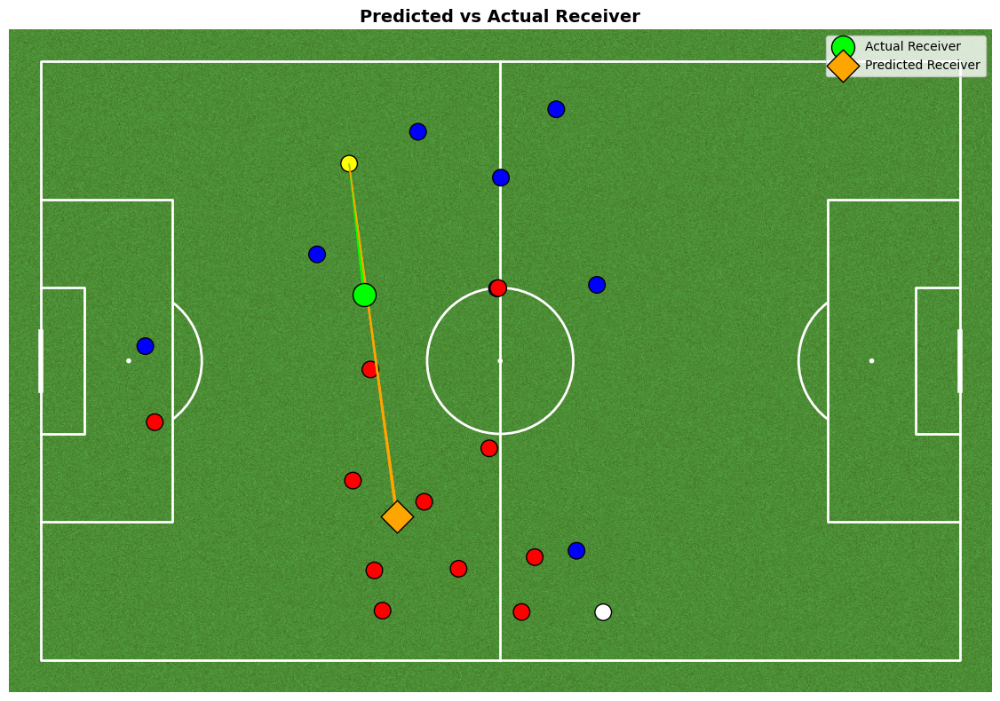

In [219]:
example_scene = val_loader.dataset[9]
visualize_pass_prediction(example_scene, model, title="Predicted vs Actual Receiver", show_arrows=True)


In [220]:
import plotly.graph_objects as go
import numpy as np
import torch

def visualize_pass_prediction_plotly(scene_data, model, title="Predicted vs Actual Receiver (Plotly Interactive)"):
    """
    Interactive visualization of one decision frame using Plotly.
    Works great inside Jupyter and Streamlit.
    """
    model.eval()
    scene_data = scene_data.to(device)

    # --- Model inference ---
    with torch.no_grad():
        scores = model(scene_data.x, scene_data.edge_index, scene_data.batch).cpu().numpy()
    pred_index = int(np.argmax(scores))
    true_index = int(scene_data.y.item())

    # --- Extract data ---
    pos = scene_data.x[:, :2].cpu().numpy().copy()
    vxvy = scene_data.x[:, 2:4].cpu().numpy()
    is_ball = scene_data.x[:, 4].cpu().numpy().astype(bool)
    team_flag = scene_data.x[:, 5].cpu().numpy()
    is_carrier = scene_data.x[:, 6].cpu().numpy().astype(bool)

    # --- Scale to full pitch (115x75) ---
    pos[:, 0] *= 115
    pos[:, 1] *= 75

    # --- Assign colors ---
    colors = np.full(len(pos), "gray", dtype=object)
    colors[team_flag == 1] = "blue"
    colors[team_flag == 0] = "red"
    colors[is_ball] = "white"
    colors[is_carrier] = "yellow"

    # --- Hover text ---
    hover_text = []
    for i in range(len(pos)):
        info = []
        if is_ball[i]:
            info.append("⚽ Ball")
        elif is_carrier[i]:
            info.append("🟡 Carrier")
        else:
            info.append("Player")
        team = "Team A" if team_flag[i] == 1 else ("Team B" if team_flag[i] == 0 else "Unknown")
        info.append(f"Team: {team}")
        info.append(f"Vel: ({vxvy[i,0]:.2f}, {vxvy[i,1]:.2f})")
        hover_text.append("<br>".join(info))

    # --- Base figure with pitch background ---
    fig = go.Figure()

    # Pitch layout (UEFA-style dimensions)
    fig.update_layout(
        title=dict(text=title, x=0.5, font=dict(size=18)),
        xaxis=dict(range=[0, 115], visible=False),
        yaxis=dict(range=[0, 75], visible=False, scaleanchor="x", scaleratio=1),
        plot_bgcolor="green",
        paper_bgcolor="white",
        width=900, height=600,
    )

    # Draw pitch outline
    pitch_lines = [
        dict(type="rect", x0=0, y0=0, x1=115, y1=75, line=dict(color="white", width=3)),
        dict(type="line", x0=57.5, y0=0, x1=57.5, y1=75, line=dict(color="white", width=2))
    ]
    fig.update_layout(shapes=pitch_lines)

    # --- Scatter players ---
    fig.add_trace(go.Scatter(
        x=pos[:, 0], y=pos[:, 1],
        mode="markers",
        marker=dict(size=16, color=colors, line=dict(color="black", width=1)),
        text=hover_text,
        hoverinfo="text",
        name="Players"
    ))

    # --- Highlight predicted and actual receivers ---
    if 0 <= true_index < len(pos):
        fig.add_trace(go.Scatter(
            x=[pos[true_index, 0]], y=[pos[true_index, 1]],
            mode="markers",
            marker=dict(size=25, color="lime", symbol="circle"),
            name="Actual Receiver"
        ))
    if 0 <= pred_index < len(pos):
        fig.add_trace(go.Scatter(
            x=[pos[pred_index, 0]], y=[pos[pred_index, 1]],
            mode="markers",
            marker=dict(size=25, color="orange", symbol="diamond"),
            name="Predicted Receiver"
        ))

    # --- Add pass arrows ---
    if is_carrier.any():
        carrier_pos = pos[is_carrier][0]
        if 0 <= true_index < len(pos):
            fig.add_annotation(
                x=pos[true_index, 0], y=pos[true_index, 1],
                ax=carrier_pos[0], ay=carrier_pos[1],
                arrowhead=3, arrowsize=2, arrowwidth=2,
                arrowcolor="lime", opacity=0.9
            )
        if 0 <= pred_index < len(pos):
            fig.add_annotation(
                x=pos[pred_index, 0], y=pos[pred_index, 1],
                ax=carrier_pos[0], ay=carrier_pos[1],
                arrowhead=3, arrowsize=2, arrowwidth=2,
                arrowcolor="orange", opacity=0.9
            )

    fig.show()


In [221]:
example_scene = val_loader.dataset[5]
visualize_pass_prediction_plotly(example_scene, model)


In [222]:
example_scene

Data(x=[23, 8], edge_index=[2, 506], edge_attr=[506, 6], y=[1], y_success=[1], match_id=[1])

## Inspecting Per-Node Receiver Scores (No Softmax)

After training the GNN, each node outputs a scalar value from the final linear layer — this value is not a probability, but a score representing how confident the model is that this node is the pass receiver.

In [223]:
import pandas as pd
import numpy as np
import torch

@torch.no_grad()
def scene_receiver_scores(model, scene_data, device="cpu", topk=10):
    """
    Shows each node's scalar score (raw output of the final layer)
    for a given decision frame (scene).
    """
    model.eval()
    sd = scene_data.to(device)
    
    # Get model outputs (scalar scores for each node)
    scores = model(sd.x, sd.edge_index, sd.batch)
    scores = scores.squeeze(-1).detach().cpu().numpy()  # [num_nodes]
    
    # Identify key indices
    pred_idx = int(np.argmax(scores))
    true_idx = int(sd.y.item())

    # Build DataFrame for display
    df = pd.DataFrame({
        "node_idx": np.arange(len(scores)),
        "score": scores,
        "is_ball": (sd.x[:, 4] > 0.5).cpu().numpy(),
        "is_carrier": (sd.x[:, 6] > 0.5).cpu().numpy(),
        "team_flag": sd.x[:, 5].cpu().numpy(),
        "x": sd.x[:, 0].cpu().numpy(),
        "y": sd.x[:, 1].cpu().numpy()
    })

    # Sort by score (descending)
    df = df.sort_values("score", ascending=False).reset_index(drop=True)
    
    print(f"Predicted receiver node index: {pred_idx}")
    print(f"Actual receiver node index:    {true_idx}")
    print()
    display(df.head(topk))
    return df, scores


In [224]:
example_scene = val_loader.dataset[5]
df_scores, scores = scene_receiver_scores(model, example_scene, device=device, topk=10)


Predicted receiver node index: 4
Actual receiver node index:    2



,node_idx,score,is_ball,is_carrier,team_flag,x,y
0,4,-0.093431,False,False,1.0,0.604025,0.360800
1,2,-1.099753,False,False,1.0,0.642024,0.522267
2,6,-2.047383,False,False,1.0,0.592461,0.639067
3,8,-2.204762,False,False,1.0,0.774191,0.374533
4,3,-3.107256,False,False,1.0,0.703335,0.686800
5,7,-4.005786,False,False,1.0,0.717469,0.756133
6,1,-5.361954,False,False,1.0,0.810079,0.638133
7,9,-5.683649,False,False,1.0,0.698929,0.817067
8,5,-7.146502,False,False,1.0,0.844773,0.713733
9,0,-7.408765,False,False,1.0,0.228448,0.488533


# Redefining the Task: Predicting xPass (Pass Success Probability)
🎯 Goal

We now want the GNN to output a single scalar per graph (scene):

xPass = P(pass_success | player positions, velocities, context)

That means:

We are no longer classifying nodes (receivers),

But predicting a graph-level binary target: 1 = successful pass, 0 = failed pass.

## Data Preparation (Graph-Level Labels)

When you built all_graphs, each graph dictionary already has:

"y_pass_success": 0 or 1 or None


So now, we’ll convert those graphs into PyTorch Geometric Data objects where:

data.y is a single scalar (float tensor) — the label for that scene.

Let’s adapt our conversion function.

### Convert Graph Dicts to PyG Data for xPass

In [225]:
from torch_geometric.data import Data
import torch

def to_pyg_data_xpass(g: dict) -> Data:
    """
    Convert one graph dictionary (decision frame) into a PyG Data object
    for xPass prediction (graph-level binary classification).
    """
    x = torch.tensor(g["nodes"], dtype=torch.float32)
    edge_index = torch.tensor(np.vstack([g["senders"], g["receivers"]]), dtype=torch.long)
    edge_attr = torch.tensor(g["edges"], dtype=torch.float32)

    y = torch.tensor([float(g["y_pass_success"])], dtype=torch.float32)

    return Data(x=x, edge_index=edge_index, edge_attr=edge_attr, y=y)


### Create a Dataset and DataLoader

In [226]:
from torch_geometric.loader import DataLoader
from sklearn.model_selection import train_test_split

# Convert all graphs to PyG Data objects (only those with valid labels)
xpass_graphs = [to_pyg_data_xpass(g) for g in all_graphs if g.get("y_pass_success") is not None]

train_graphs, val_graphs = train_test_split(xpass_graphs, test_size=0.2, random_state=42)

train_loader = DataLoader(train_graphs, batch_size=16, shuffle=True)
val_loader = DataLoader(val_graphs, batch_size=16, shuffle=False)

print(f"✅ Prepared {len(train_graphs)} train and {len(val_graphs)} validation graphs for xPass prediction.")


✅ Prepared 249317 train and 62330 validation graphs for xPass prediction.


### Graph Neural Network for xPass (Graph Classification)

Now we’ll modify the model:

We’ll still use GraphSAGE to learn node embeddings.

Then, we’ll pool node embeddings into a single graph representation (using global mean pooling).

Finally, a linear layer + sigmoid outputs xPass probability.

### xPass Model Definition

In [227]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import SAGEConv, global_mean_pool

class XPassPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels=64, num_layers=2):
        super().__init__()
        self.convs = nn.ModuleList()
        self.convs.append(SAGEConv(in_channels, hidden_channels))
        for _ in range(num_layers - 1):
            self.convs.append(SAGEConv(hidden_channels, hidden_channels))
        self.lin = nn.Linear(hidden_channels, 1)

    def forward(self, x, edge_index, batch):
        for conv in self.convs:
            x = F.relu(conv(x, edge_index))
        # Pool across all nodes in each graph
        x = global_mean_pool(x, batch)
        # Predict probability of pass success
        return torch.sigmoid(self.lin(x)).squeeze(-1)


### Train Loop for xPass

In [228]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = XPassPredictor(in_channels=train_graphs[0].x.shape[1]).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.BCELoss()  # binary cross entropy loss

def train_one_epoch(model, loader):
    model.train()
    total_loss = 0
    for data in loader:
        data = data.to(device)
        optimizer.zero_grad()
        out = model(data.x, data.edge_index, data.batch)
        loss = criterion(out, data.y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * data.num_graphs
    return total_loss / len(loader.dataset)

@torch.no_grad()
def evaluate(model, loader):
    model.eval()
    preds, trues = [], []
    for data in loader:
        data = data.to(device)
        out = model(data.x, data.edge_index, data.batch)
        preds.append(out.cpu())
        trues.append(data.y.cpu())
    preds = torch.cat(preds)
    trues = torch.cat(trues)
    acc = ((preds > 0.5) == (trues > 0.5)).float().mean().item()
    return acc


### Training Loop

In [229]:
for epoch in range(10):
    loss = train_one_epoch(model, train_loader)
    acc = evaluate(model, val_loader)
    print(f"Epoch {epoch+1:02d}: Loss = {loss:.4f}, Val Acc = {acc*100:.2f}%")


Epoch 01: Loss = 0.3774, Val Acc = 84.37%
Epoch 02: Loss = 0.3498, Val Acc = 84.69%
Epoch 03: Loss = 0.3335, Val Acc = 85.24%
Epoch 04: Loss = 0.3198, Val Acc = 85.36%
Epoch 05: Loss = 0.3122, Val Acc = 85.53%
Epoch 06: Loss = 0.3078, Val Acc = 85.91%
Epoch 07: Loss = 0.3046, Val Acc = 85.70%
Epoch 08: Loss = 0.3020, Val Acc = 85.89%
Epoch 09: Loss = 0.2998, Val Acc = 85.73%
Epoch 10: Loss = 0.2982, Val Acc = 85.93%


### To elevate this model from good → great:

✅ Add contextual features (distance to goal, player density, opponent proximity)

✅ Add temporal info (previous frame → movement trends)

✅ Use attention-based GNN (GAT) → interpret which players influenced xPass most

✅ Evaluate AUC and Brier score (better than accuracy for probabilistic models)

In [234]:
import torch
import numpy as np

model.eval()
y_true, y_pred = [], []

with torch.no_grad():
    for data in val_loader:
        data = data.to(device)
        out = model(data.x, data.edge_index, data.batch)
        y_true.extend(data.y.cpu().numpy())
        y_pred.extend(torch.sigmoid(out).cpu().numpy())  # sigmoid → probability


In [236]:
import numpy as np

baseline_success_rate = np.mean(y_true)
print(f"⚽ Actual mean pass success rate in validation set: {baseline_success_rate*100:.2f}%")


⚽ Actual mean pass success rate in validation set: 83.68%


This is your empirical prior — in the Premier League, this is typically around 80–86% depending on how passes are filtered (e.g., including clearances or set plays).

In [237]:
model_val_acc = 0.8593  # your best validation accuracy
improvement = (model_val_acc - baseline_success_rate) * 100
print(f"🚀 Model improvement over baseline: {improvement:.2f} percentage points")


🚀 Model improvement over baseline: 2.25 percentage points


In [238]:
@torch.no_grad()
def show_xpass_for_scene(model, scene_data):
    model.eval()
    scene_data = scene_data.to(device)
    xpass = model(scene_data.x, scene_data.edge_index, scene_data.batch).item()
    print(f"Predicted xPass (pass success probability): {xpass:.3f}")
    return xpass

example_scene = val_loader.dataset[5]
show_xpass_for_scene(model, example_scene)


Predicted xPass (pass success probability): 0.996


0.9955028891563416

In [ ]:
import torch
import numpy as np

@torch.no_grad()
def evaluate_xpass_distribution(model, val_loader, device="cpu"):
    """
    Evaluate the model on all validation scenes and compare:
    - Mean predicted xPass (model confidence)
    - Actual mean pass success rate
    """
    model.eval()
    y_true, y_pred = [], []

    for data in val_loader:
        data = data.to(device)
        out = model(data.x, data.edge_index, data.batch)
        y_true.extend(data.y.cpu().numpy())
        y_pred.extend(torch.sigmoid(out).cpu().numpy())  # ensure probability

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # --- Metrics ---
    actual_success_rate = y_true.mean()
    mean_pred_xpass = y_pred.mean()
    diff = mean_pred_xpass - actual_success_rate

    print(f"⚽ Actual mean pass success rate: {actual_success_rate:.3f}")
    print(f"🤖 Mean predicted xPass (model’s belief): {mean_pred_xpass:.3f}")
    print(f"📊 Difference (Model - Actual): {diff:.3f}")

    return actual_success_rate, mean_pred_xpass, y_true, y_pred

# Run it
actual_mean, pred_mean, y_true, y_pred = evaluate_xpass_distribution(model, val_loader, device=device)


⚽ Actual mean pass success rate: 0.837
🤖 Mean predicted xPass (model’s belief): 0.700
📊 Difference (Model - Actual): -0.136


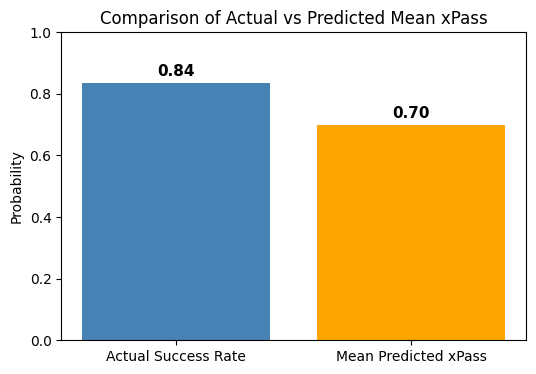

In [240]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))
plt.bar(["Actual Success Rate", "Mean Predicted xPass"], [actual_mean, pred_mean], color=["steelblue", "orange"])
plt.ylim(0, 1)
plt.ylabel("Probability")
plt.title("Comparison of Actual vs Predicted Mean xPass")
for i, v in enumerate([actual_mean, pred_mean]):
    plt.text(i, v + 0.02, f"{v:.2f}", ha='center', fontsize=11, fontweight='bold')
plt.show()


The model is underconfident — it’s too cautious about pass success.

# ⚽️ Understanding and Visualizing xPass (Expected Pass Success Probability)

---

## 🧠 What is xPass?

**xPass** (*Expected Pass Completion*) represents the **probability that a pass will be successfully received by a teammate**, given:

- Player and ball positions  
- Team structure and opponent pressure  
- Dynamic features such as player velocity and spacing  

Formally:

\[
xPass = P(\text{pass success} \mid \text{player configuration at decision frame})
\]

---
## 🎯 How to Interpret xPass

| **xPass Value** | **Meaning** | **Football Insight** |
|:----------------:|:------------|:----------------------|
| 0.90–1.00 | Very likely to succeed | Simple sideways/backward passes under no pressure. |
| 0.70–0.89 | Likely to succeed | Forward passes with mild pressure or clear lanes. |
| 0.40–0.69 | Uncertain / risky | Threaded or long passes between defenders. |
| 0.00–0.39 | Unlikely | Long aerial balls or heavily pressured plays. |

> The closer to **1.0**, the more the model believes the pass will succeed.  
> The closer to **0.0**, the riskier or harder the pass.

---



In [286]:
for i in range(5):
    g = all_graphs[i]
    print(f"\n🧠 Graph {i}")
    print("Keys:", g.keys())
    print("Has edge_index?", "edge_index" in g)



🧠 Graph 0
Keys: dict_keys(['nodes', 'edges', 'senders', 'receivers', 'globals', 'player_ids', 'is_ball', 'receiver_mask', 'target_index', 'y_pass_success', 'y_lead_shot', 'y_lead_goal'])
Has edge_index? False

🧠 Graph 1
Keys: dict_keys(['nodes', 'edges', 'senders', 'receivers', 'globals', 'player_ids', 'is_ball', 'receiver_mask', 'target_index', 'y_pass_success', 'y_lead_shot', 'y_lead_goal'])
Has edge_index? False

🧠 Graph 2
Keys: dict_keys(['nodes', 'edges', 'senders', 'receivers', 'globals', 'player_ids', 'is_ball', 'receiver_mask', 'target_index', 'y_pass_success', 'y_lead_shot', 'y_lead_goal'])
Has edge_index? False

🧠 Graph 3
Keys: dict_keys(['nodes', 'edges', 'senders', 'receivers', 'globals', 'player_ids', 'is_ball', 'receiver_mask', 'target_index', 'y_pass_success', 'y_lead_shot', 'y_lead_goal'])
Has edge_index? False

🧠 Graph 4
Keys: dict_keys(['nodes', 'edges', 'senders', 'receivers', 'globals', 'player_ids', 'is_ball', 'receiver_mask', 'target_index', 'y_pass_success', 'y_

In [287]:
import torch
import pandas as pd
from tqdm import tqdm

@torch.no_grad()
def predict_xpass_for_all_graphs(model, all_graphs, device="cpu"):
    """
    Predict xPass (pass success probability) for all graphs in the dataset.
    Returns a DataFrame with match, frame, passer_id, and predicted xPass.
    """
    model.eval()
    results = []

    for g in tqdm(all_graphs, desc="Predicting xPass for all graphs"):
        try:
            # Skip invalid or non-pass scenes
            if g is None or "nodes" not in g or g.get("y_pass_success", None) is None:
                continue
            if g["target_index"] == -1:
                continue  # skip scenes without a pass target

            # Convert to PyG data
            data = to_pyg_data(g)
            if data is None:
                continue
            data = data.to(device)

            # Predict
            out = model(data.x, data.edge_index, data.batch)
            xpass_pred = float(torch.sigmoid(out).item())

            # Get passer (carrier)
            passer_id = g.get("player_ids", [None])
            carrier_mask = g["is_ball"] == False
            if "player_in_possession_id" in g:
                passer = g["player_in_possession_id"]
            elif hasattr(g, "globals"):
                passer = g["player_ids"][int(g["globals"][0, 0])] if g["globals"] is not None else None
            else:
                passer = None

            results.append({
                "match_id": g["globals"][0, 0] if "globals" in g else None,
                "frame": g["globals"][0, 2] if "globals" in g else None,
                "player_in_possession_id": passer,
                "xpass_pred": xpass_pred,
                "y_pass_success": g["y_pass_success"]
            })

        except Exception as e:
            print(f"⚠️ Skipped one graph due to {type(e).__name__}: {e}")
            continue

    df_xpass = pd.DataFrame(results)
    print(f"✅ Computed xPass for {len(df_xpass)} graphs out of {len(all_graphs)} total")
    return df_xpass

# Run it
df_xpass = predict_xpass_for_all_graphs(model, dataset, device=device)


Predicting xPass for all graphs: 100%|██████████| 311647/311647 [00:21<00:00, 14439.07it/s]

✅ Computed xPass for 0 graphs out of 311647 total


In [289]:
dataset

FootballDecisionDataset(311647)

In [292]:
print(f"📦 Total graphs in dataset: {len(dataset)}")

data_example = dataset[100]
print(data_example)


📦 Total graphs in dataset: 311647
Data(x=[23, 8], edge_index=[2, 506], edge_attr=[506, 6], y=[1], y_success=[1], match_id=[1])


In [293]:
print("Node feature shape:", data_example.x.shape)
print("First node feature vector:\n", data_example.x[0])


Node feature shape: torch.Size([23, 8])
First node feature vector:
 tensor([ 0.5864,  0.7052,  0.0680, -0.1062,  0.0000,  1.0000,  0.0000,  1.0000])


In [294]:
print("Edge index shape:", data_example.edge_index.shape)
print("First 10 edges:\n", data_example.edge_index[:, :10])


Edge index shape: torch.Size([2, 506])
First 10 edges:
 tensor([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10]])


In [297]:
data_example
print(data_example.x.shape)


torch.Size([23, 8])


In [298]:
# Check if original dataset object stores extra attributes
print(dir(data_example))


['__abstractmethods__', '__annotations__', '__call__', '__cat_dim__', '__class__', '__contains__', '__copy__', '__deepcopy__', '__delattr__', '__delitem__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattr__', '__getattribute__', '__getitem__', '__getstate__', '__gt__', '__hash__', '__inc__', '__init__', '__init_subclass__', '__iter__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setitem__', '__setstate__', '__sizeof__', '__slots__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_edge_attr_cls', '_edge_to_layout', '_edges_to_layout', '_get_edge_index', '_get_tensor', '_get_tensor_size', '_multi_get_tensor', '_put_edge_index', '_put_tensor', '_remove_edge_index', '_remove_tensor', '_store', '_tensor_attr_cls', '_to_type', 'apply', 'apply_', 'batch', 'clone', 'coalesce', 'concat', 'contains_isolated_nodes', 'contains_self_loops', 'contiguous', 'coo', 'cpu', 'csc'

In [300]:
print(all_graphs[0].keys())
print(all_graphs[0]["player_ids"])


dict_keys(['nodes', 'edges', 'senders', 'receivers', 'globals', 'player_ids', 'is_ball', 'receiver_mask', 'target_index', 'y_pass_success', 'y_lead_shot', 'y_lead_goal'])
[ 4.9400e+02  1.3290e+03  4.5040e+03  5.7940e+03  1.1438e+04  1.2168e+04
  1.2941e+04  1.3068e+04  1.7969e+04  3.2264e+04  3.2862e+04  1.4980e+03
  1.6740e+03  6.8470e+03  1.1383e+04  1.1557e+04  1.2112e+04  1.2380e+04
  1.3078e+04  2.3109e+04  2.4305e+04  7.0672e+04 -1.0000e+00]


In [306]:
is_carrier_column = data_example.x[:, 6]
print(is_carrier_column)


tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0.])


In [307]:
passer_id = all_graphs[0]["player_ids"][carrier_index]
print("Player ID of carrier:", passer_id)


Player ID of carrier: 32264.0


In [301]:
import torch

# Find index of ball carrier
carrier_index = (data_example.x[:, 6] > 0.5).nonzero(as_tuple=True)[0].item()

# Look up corresponding player ID
passer_id = all_graphs[0]["player_ids"][carrier_index]
print(f"🎯 Passer Player ID: {passer_id}")


🎯 Passer Player ID: 32264.0


In [302]:
carrier_index

9

In [308]:
@torch.no_grad()
def compute_xpass_with_passer(model, dataset, all_graphs, device="cpu"):
    """
    Predict xPass for all graphs and record the passer ID.
    """
    model.eval()
    results = []

    for i, data in enumerate(dataset):
        try:
            data = data.to(device)
            out = model(data.x, data.edge_index, data.batch)
            xpass = torch.sigmoid(out).item()

            # Find passer (carrier) node
            carrier_idx = (data.x[:, 6] > 0.5).nonzero(as_tuple=True)[0].item()
            passer_id = all_graphs[i]["player_ids"][carrier_idx]

            results.append({
                "graph_index": i,
                "player_in_possession_id": passer_id,
                "xpass": xpass,
            })

        except Exception as e:
            print(f"⚠️ Skipped graph {i}: {type(e).__name__} → {e}")
            continue

    df_xpass = pd.DataFrame(results)
    print(f"✅ Computed xPass for {len(df_xpass)} graphs.")
    return df_xpass


In [309]:
df_xpass = compute_xpass_with_passer(model, dataset, all_graphs, device=device)


✅ Computed xPass for 311647 graphs.


In [310]:
df_xpass

,graph_index,player_in_possession_id,xpass
0,0,11438.0,0.730946
1,1,13068.0,0.731052
2,2,4504.0,0.684262
3,3,70672.0,0.718392
4,4,1674.0,0.640683
...,...,...,...
311642,311642,14488.0,0.674688
311643,311643,24399.0,0.699816
311644,311644,12629.0,0.634385
311645,311645,24638.0,0.654552


In [311]:
df_xpass.columns

Index(['graph_index', 'player_in_possession_id', 'xpass'], dtype='object')

In [313]:
# --- Step 1: Build a player reference dictionary ---
from pathlib import Path
import pandas as pd

player_records = []

for fpath in Path(DYNAMIC_DIR).glob("*.parquet"):
    df_ev = pd.read_parquet(fpath)
    if "player_id" not in df_ev.columns:
        continue
    subset = df_ev[["player_id", "player_name", "team_shortname"]].dropna().drop_duplicates()
    player_records.append(subset)

df_players = pd.concat(player_records, ignore_index=True).drop_duplicates("player_id")
print(f"✅ Loaded {len(df_players)} unique players from event files")
df_players.head()


✅ Loaded 561 unique players from event files


,player_id,player_name,team_shortname
0,18686,E. Eze,Crystal Palace
1,19164,J. Mateta,Crystal Palace
2,18526,D. Henderson,Crystal Palace
3,11274,I. Sarr,Crystal Palace
4,32267,D. Muñoz,Crystal Palace


In [314]:
df_xpass_named = df_xpass.merge(
    df_players,
    left_on="player_in_possession_id",
    right_on="player_id",
    how="left"
)
print(f"✅ Merged xPass data with player names: {df_xpass_named.shape}")
df_xpass_named.head()


✅ Merged xPass data with player names: (311647, 6)


,graph_index,player_in_possession_id,xpass,player_id,player_name,team_shortname
0,0,11438.0,0.730946,11438,Andreas Pereira,Fulham
1,1,13068.0,0.731052,13068,S. Lukić,Fulham
2,2,4504.0,0.684262,4504,I. Diop,Fulham
3,3,70672.0,0.718392,70672,K. Mainoo,Manchester U
4,4,1674.0,0.640683,1674,Casemiro,Manchester U


In [316]:
# Compute Each Player’s Mean xPass
player_xpass_summary = (
    df_xpass_named.groupby(["player_id", "player_name", "team_shortname"])
    .agg(
        total_passes=("xpass", "count"),
        mean_xpass=("xpass", "mean")
    )
    .reset_index()
    .sort_values("mean_xpass", ascending=False)
)
player_xpass_summary.head(10)


,player_id,player_name,team_shortname,total_passes,mean_xpass
528,749743,A. Pond,Wolverhampton,1,0.730107
515,662534,J. Sanda,Southampton,15,0.727452
545,905483,M. Mane,Wolverhampton,4,0.727396
457,68867,A. Dorrington,Tottenham,16,0.726696
533,810505,W. Alves,Leicester,1,0.726662
527,746187,C. Kporha,Crystal Palace,2,0.721246
548,925288,J. Simpson-Pusey,Manchester City,104,0.721083
501,390485,L. Orford,West Ham,30,0.720723
534,811683,J. Danns,Liverpool,1,0.719671
79,7863,N. Aké,Manchester City,486,0.719138


In [320]:
player_xpass_summary.shape

(553, 5)

In [318]:
ev.pass_outcome.value_counts()

pass_outcome
successful      692
unsuccessful    153
offside           2
Name: count, dtype: int64

In [319]:
# Calculate Actual Pass Accuracy from Events
# Aggregate all pass events
all_events = []
for fpath in Path(DYNAMIC_DIR).glob("*.parquet"):
    df_ev = pd.read_parquet(fpath)
    if "event_type" not in df_ev.columns or "pass_outcome" not in df_ev.columns:
        continue
    passes = df_ev[df_ev["end_type"] == "pass"].copy()
    passes["pass_success"] = passes["pass_outcome"].eq("successful").astype(int)
    all_events.append(passes[["player_id", "pass_success"]])

df_pass_accuracy = (
    pd.concat(all_events)
    .groupby("player_id")
    .agg(actual_pass_accuracy=("pass_success", "mean"))
    .reset_index()
)
print(f"✅ Computed actual pass accuracy for {len(df_pass_accuracy)} players")


✅ Computed actual pass accuracy for 555 players


In [321]:
df_compare = player_xpass_summary.merge(
    df_pass_accuracy, on="player_id", how="inner"
)

df_compare["overperformance"] = df_compare["actual_pass_accuracy"] - df_compare["mean_xpass"]

df_compare = df_compare.sort_values("overperformance", ascending=False)
df_compare.head(10)


,player_id,player_name,team_shortname,total_passes,mean_xpass,actual_pass_accuracy,overperformance
550,24009,G. Edmundson,Ipswich Town,1,0.630429,1.0,0.369571
421,799292,Vitor Reis,Manchester City,3,0.687855,1.0,0.312145
354,669443,J. Meghoma,Brentford FC,2,0.692728,1.0,0.307272
349,11639,S. McTominay,Manchester U,7,0.693006,1.0,0.306994
326,673706,C. Echeverri,Manchester City,3,0.694269,1.0,0.305731
322,61335,Chiquinho,Wolverhampton,3,0.694401,1.0,0.305599
134,13553,F. Onyeka,Brentford FC,6,0.705873,1.0,0.294127
84,662537,M. Amougou,Chelsea,8,0.708314,1.0,0.291686
8,811683,J. Danns,Liverpool,1,0.719671,1.0,0.280329
4,810505,W. Alves,Leicester,1,0.726662,1.0,0.273338


In [322]:
df_compare.tail(10)

,player_id,player_name,team_shortname,total_passes,mean_xpass,actual_pass_accuracy,overperformance
5,746187,C. Kporha,Crystal Palace,2,0.721246,0.571429,-0.149817
545,883611,R. Dixon,Everton,16,0.655460,0.500000,-0.155460
541,16196,Carlos Vinícius,Fulham,4,0.664871,0.500000,-0.164871
518,154076,Youssef Chermiti,Everton,7,0.674544,0.500000,-0.174544
452,69175,Z. Silcott-Duberry,Bournemouth,2,0.684473,0.500000,-0.184473
535,862014,H. Armstrong,Everton,14,0.668430,0.428571,-0.239858
549,714617,Gustavo Nunes,Brentford FC,3,0.643740,0.333333,-0.310407
551,919228,Luiz Felipe,Nottingham,1,0.600277,0.000000,-0.600277
233,24399,T. King,Wolverhampton,1,0.699816,0.000000,-0.699816
40,968141,W. Lankshear,Tottenham,1,0.712109,0.000000,-0.712109


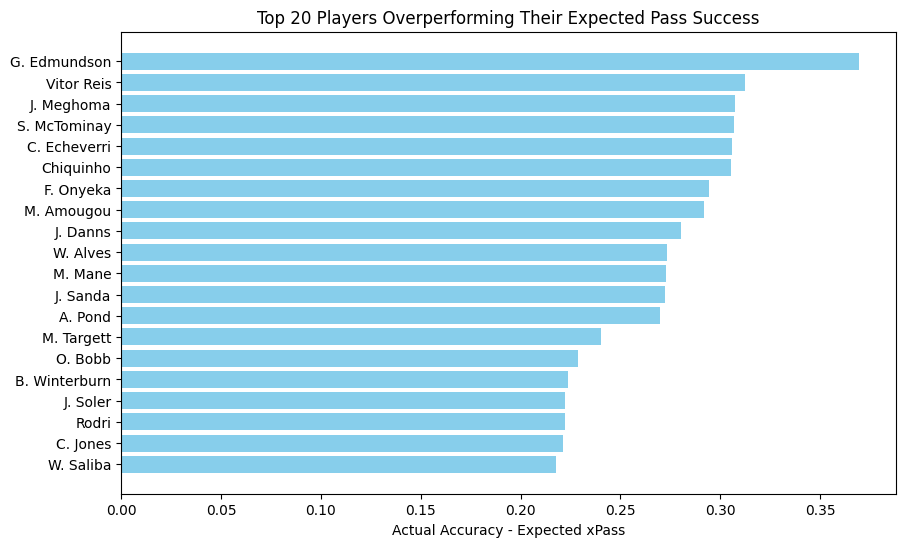

In [323]:
import matplotlib.pyplot as plt

top_players = df_compare.head(20)
plt.figure(figsize=(10,6))
plt.barh(top_players["player_name"], top_players["overperformance"], color="skyblue")
plt.xlabel("Actual Accuracy - Expected xPass")
plt.title("Top 20 Players Overperforming Their Expected Pass Success")
plt.gca().invert_yaxis()
plt.show()
